In [1]:
import numpy as np
import matplotlib.pyplot as plt
import os
from scipy.stats import multivariate_normal, poisson, norm, expon, chi2, multinomial
from scipy.optimize import curve_fit
from numpy.polynomial.polynomial import polyfit
from scipy.stats import linregress
from itertools import groupby, product
import pandas as pd
import imageio.v2 as imageio

import glob
from matplotlib.colors import LinearSegmentedColormap

import datetime

from matplotlib.colors import PowerNorm

In [2]:
#Definitions

####################################################################
######################## PR FUNCTIONS ##############################
####################################################################

def combined_sorted_PRs(foldername):
    # Step 2: Initialize empty lists
    all_PRs = []
    all_Seeds = []
    all_Bounds = []
    
    # Step 3: Load and append data from each file
    for file in foldername:
        PRs = np.load(file)
        all_PRs.extend(data["PRs"])
        all_Seeds.extend(data["Seeds"])
        all_Bounds.extend(data["Bounds"])
        print(f"Loaded {file}: {len(data['PRs'])} entries")
    
    # Step 4: Convert to NumPy arrays
    PRs = np.array(all_PRs)
    Seeds = np.array(all_Seeds)
    Bounds = np.array(all_Bounds)
    
    # Step 5: Save combined file
    np.savez("PRs_results_combined.npz", Data=Data, Seeds=Seeds, Bounds=Bounds)
    print(f"Saved combined results to 'PRs_results_combined.npz'")
    
    # Step 1: Get sorting indices for Seeds
    sort_idx = np.lexsort((Bounds, Seeds))
    
    # Step 2: Apply sorting to all arrays
    PRs_sorted = Data[sort_idx]
    Seeds_sorted = Seeds[sort_idx]
    Bounds_sorted = Bounds[sort_idx]

    return PRs_sorted, Seeds_sorted, Bounds_sorted

####################################################################
######################## llE FUNCTIONS #############################
####################################################################

def extended_combined_sorted_LLEs(foldername):
    # Step 2: Initialize empty lists
    all_distances = []
    all_LLEs = []
    all_activity_X1 = []
    all_activity_X2 = []
    all_Weights_Seeds = []
    all_Initialisation_Seeds = []
    all_Bounds = []
    
    # Step 3: Load and append data from each file
    for file in files:
        data = np.load(file)
        all_distances.extend(data["Distances"])
        all_LLEs.extend(data["LLEs"])
        all_activity_X1.extend(data["Activity_X1"])
        all_activity_X2.extend(data["Activity_X2"])
        all_Weights_Seeds.extend(data["Weights_Seeds"])
        all_Initialisation_Seeds.extend(data["Initialisation_Seeds"])
        all_Bounds.extend(data["Bounds"])
        print(f"Loaded {file}: {len(data['LLEs'])} entries")
    
    # Step 4: Convert to NumPy arrays
    Distances = np.array(all_distances)
    LLEs = np.array(all_LLEs)
    Activity_X1 = np.array(all_activity_X1)
    Activity_X2 = np.array(all_activity_X2)
    Weights_Seeds = np.array(all_Weights_Seeds)
    Initialisation_Seeds = np.array(all_Initialisation_Seeds)
    Bounds = np.array(all_Bounds)
    
    # Step 5: Save combined file
    np.savez("results_combined.npz", LLEs=LLEs, Distances=Distances, Activity_X1=Activity_X1, Activity_X2=Activity_X2, Weights_Seeds=Weights_Seeds, Initialisation_Seeds=Initialisation_Seeds, Bounds=Bounds)
    #np.savez("results_combined.npz", LLEs=LLEs, Seeds=Seeds, Bounds=Bounds)
    print(f"Saved combined results to 'LLEs_results_combined.npz'")
    
    # Step 1: Get sorting indices for Seeds
    sort_idx = np.lexsort((Bounds, Initialisation_Seeds, Weights_Seeds))
    
    # Step 2: Apply sorting to all arrays
    Distances_sorted = Distances[sort_idx]
    LLEs_sorted = LLEs[sort_idx]
    Activity_X1_sorted = Activity_X1[sort_idx]
    Activity_X2_sorted = Activity_X2[sort_idx]
    Weights_Seeds_sorted = Weights_Seeds[sort_idx]
    Initialisation_Seeds_sorted = Initialisation_Seeds[sort_idx]
    Bounds_sorted = Bounds[sort_idx]

    return Distances_sorted, LLEs_sorted, Activity_X1_sorted, Activity_X2_sorted, Weights_Seeds_sorted, Initialisation_Seeds_sorted, Bounds_sorted
    
def combined_sorted_LLEs_old(foldername):
    # Step 2: Initialize empty lists
    all_distances = []
    all_LLEs = []
    all_Seeds = []
    all_Bounds = []
    
    # Step 3: Load and append data from each file
    for file in files:
        data = np.load(file)
        all_distances.extend(data["Distances"])
        all_LLEs.extend(data["LLEs"])
        all_Seeds.extend(data["Seeds"])
        all_Bounds.extend(data["Bounds"])
        print(f"Loaded {file}: {len(data['LLEs'])} entries")
    
    # Step 4: Convert to NumPy arrays
    Distances = np.array(all_distances)
    LLEs = np.array(all_LLEs)
    Seeds = np.array(all_Seeds)
    Bounds = np.array(all_Bounds)
    
    # Step 5: Save combined file
    np.savez("results_combined.npz", LLEs=LLEs, Distances=Distances, Seeds=Seeds, Bounds=Bounds)
    #np.savez("results_combined.npz", LLEs=LLEs, Seeds=Seeds, Bounds=Bounds)
    print(f"Saved combined results to 'LLEs_results_combined.npz'")
    
    # Step 1: Get sorting indices for Seeds
    sort_idx = np.lexsort((Bounds, Seeds))
    
    # Step 2: Apply sorting to all arrays
    Distances_sorted = Distances[sort_idx]
    LLEs_sorted = LLEs[sort_idx]
    Seeds_sorted = Seeds[sort_idx]
    Bounds_sorted = Bounds[sort_idx]

    return Distances_sorted, LLEs_sorted, Seeds_sorted, Bounds_sorted

def combined_sorted_LLEs(files):
    # Step 2: Initialize empty lists
    all_distances = []
    all_LLEs = []
    all_Seeds = []
    all_Bounds = []
    
    # Step 3: Load and append data from each file
    for file in files:
        data = np.load(file)
        all_distances.extend(data["Distances"])
        all_LLEs.extend(data["LLEs"])
        all_Seeds.extend(data["Seeds"])
        all_Bounds.extend(data["Bounds"])
        print(f"Loaded {file}: {len(data['LLEs'])} entries")
    
    # Step 4: Convert to NumPy arrays
    Distances = np.array(all_distances)
    LLEs = np.array(all_LLEs)
    Seeds = np.array(all_Seeds)
    Bounds = np.array(all_Bounds)
    
    # Step 5: Save combined file
    np.savez("results_combined.npz", LLEs=LLEs, Distances=Distances, Seeds=Seeds, Bounds=Bounds)
    #np.savez("results_combined.npz", LLEs=LLEs, Seeds=Seeds, Bounds=Bounds)
    print(f"Saved combined results to 'LLEs_results_combined.npz'")
    
    # Step 1: Get sorting indices for Seeds
    sort_idx = np.lexsort((Bounds, Seeds))
    
    # Step 2: Apply sorting to all arrays
    Distances_sorted = Distances[sort_idx]
    LLEs_sorted = LLEs[sort_idx]
    Seeds_sorted = Seeds[sort_idx]
    Bounds_sorted = Bounds[sort_idx]

    return Distances_sorted, LLEs_sorted, Seeds_sorted, Bounds_sorted

def gains_combined_sorted_LLEs(files):
    # Step 2: Initialize empty lists
    all_LLEs = []
    all_Gains = []
    all_Weights_Seeds = []
    all_Initialisation_Seeds = []
    all_Bounds = []
    
    # Step 3: Load and append data from each file
    for file in files:
        data = np.load(file)
        all_LLEs.extend(data["LLEs"])
        all_Gains.extend(data["Gains"])
        all_Weights_Seeds.extend(data["Weights_Seeds"])
        all_Initialisation_Seeds.extend(data["Initialisation_Seeds"])
        #all_Bounds.extend(data["Bounds"])
        all_Bounds.extend(data["MSHs"])
        print(f"Loaded {file}: {len(data['LLEs'])} entries")
    
    # Step 4: Convert to NumPy arrays
    LLEs = np.array(all_LLEs)
    Gains = np.array(all_Gains)
    Weights_Seeds = np.array(all_Weights_Seeds)
    Initialisation_Seeds = np.array(all_Initialisation_Seeds)
    Bounds = np.array(all_Bounds)
    
    # Step 5: Save combined file
    np.savez("results_combined.npz", LLEs=LLEs, Gains=Gains, Weights_Seeds=Weights_Seeds, Initialisation_Seeds=Initialisation_Seeds, Bounds=Bounds)
    #np.savez("results_combined.npz", LLEs=LLEs, Seeds=Seeds, Bounds=Bounds)
    print(f"Saved combined results to 'LLEs_results_combined.npz'")
    
    # Step 1: Get sorting indices for Seeds
    sort_idx = np.lexsort((Bounds, Initialisation_Seeds, Weights_Seeds, Gains))
    
    # Step 2: Apply sorting to all arrays
    LLEs_sorted = LLEs[sort_idx]
    Gains_sorted = Gains[sort_idx]
    Weights_Seeds_sorted = Weights_Seeds[sort_idx]
    Initialisation_Seeds_sorted = Initialisation_Seeds[sort_idx]
    Bounds_sorted = Bounds[sort_idx]

    return LLEs_sorted, Gains_sorted, Weights_Seeds_sorted, Initialisation_Seeds_sorted, Bounds_sorted

def gains_combined_sorted_LLEs_old(foldername):
    # Step 2: Initialize empty lists
    all_LLEs = []
    all_Gains = []
    all_Weights_Seeds = []
    all_Initialisation_Seeds = []
    all_Bounds = []
    
    # Step 3: Load and append data from each file
    for file in files:
        data = np.load(file)
        all_LLEs.extend(data["LLEs"])
        all_Gains.extend(data["Gains"])
        all_Weights_Seeds.extend(data["Weights_Seeds"])
        all_Initialisation_Seeds.extend(data["Initialisation_Seeds"])
        #all_Bounds.extend(data["Bounds"])
        all_Bounds.extend(data["MSHs"])
        print(f"Loaded {file}: {len(data['LLEs'])} entries")
    
    # Step 4: Convert to NumPy arrays
    LLEs = np.array(all_LLEs)
    Gains = np.array(all_Gains)
    Weights_Seeds = np.array(all_Weights_Seeds)
    Initialisation_Seeds = np.array(all_Initialisation_Seeds)
    Bounds = np.array(all_Bounds)
    
    # Step 5: Save combined file
    np.savez("results_combined.npz", LLEs=LLEs, Gains=Gains, Weights_Seeds=Weights_Seeds, Initialisation_Seeds=Initialisation_Seeds, Bounds=Bounds)
    #np.savez("results_combined.npz", LLEs=LLEs, Seeds=Seeds, Bounds=Bounds)
    print(f"Saved combined results to 'LLEs_results_combined.npz'")
    
    # Step 1: Get sorting indices for Seeds
    sort_idx = np.lexsort((Bounds, Initialisation_Seeds, Weights_Seeds, Gains))
    
    # Step 2: Apply sorting to all arrays
    LLEs_sorted = LLEs[sort_idx]
    Gains_sorted = Gains[sort_idx]
    Weights_Seeds_sorted = Weights_Seeds[sort_idx]
    Initialisation_Seeds_sorted = Initialisation_Seeds[sort_idx]
    Bounds_sorted = Bounds[sort_idx]

    return LLEs_sorted, Gains_sorted, Weights_Seeds_sorted, Initialisation_Seeds_sorted, Bounds_sorted

def gains_combined_sorted_PRs(files):
    # Step 2: Initialize empty lists
    all_PRs = []
    all_Gains = []
    all_Weights_Seeds = []
    all_Initialisation_Seeds = []
    all_MSHs = []
    
    # Step 3: Load and append data from each file
    for file in files:
        data_PRs = np.load(file)
        all_PRs.extend(data_PRs["PRs"])
        all_Gains.extend(data_PRs["Gains"])
        all_Weights_Seeds.extend(data_PRs["Weights_Seeds"])
        all_Initialisation_Seeds.extend(data_PRs["Initialisation_Seeds"])
        all_MSHs.extend(data_PRs["MSHs"])
        print(f"Loaded {file}: {len(data_PRs['PRs'])} entries")
    
    # Step 4: Convert to NumPy arrays
    PRs = np.array(all_PRs)
    Gains = np.array(all_Gains)
    Weights_Seeds = np.array(all_Weights_Seeds)
    Initialisation_Seeds = np.array(all_Initialisation_Seeds)
    MSHs = np.array(all_MSHs)
    
    # Step 5: Save combined file
    np.savez("results_combined.npz", PRs=PRs, Gains=Gains, Weights_Seeds=Weights_Seeds, Initialisation_Seeds=Initialisation_Seeds, MSHs=MSHs)
    #np.savez("results_combined.npz", LLEs=LLEs, Seeds=Seeds, Bounds=Bounds)
    print(f"Saved combined results to 'PRs_results_combined.npz'")
    
    # Step 1: Get sorting indices for Seeds
    sort_idx = np.lexsort((MSHs, Initialisation_Seeds, Weights_Seeds, Gains))
    
    # Step 2: Apply sorting to all arrays
    PRs_sorted = PRs[sort_idx]
    Gains_sorted = Gains[sort_idx]
    Weights_Seeds_sorted = Weights_Seeds[sort_idx]
    Initialisation_Seeds_sorted = Initialisation_Seeds[sort_idx]
    MSHs_sorted = MSHs[sort_idx]

    return PRs_sorted, Gains_sorted, Weights_Seeds_sorted, Initialisation_Seeds_sorted, MSHs_sorted

def gains_combined_sorted_PRs_old(foldername):
    # Step 2: Initialize empty lists
    all_PRs = []
    all_Gains = []
    all_Weights_Seeds = []
    all_Initialisation_Seeds = []
    all_MSHs = []
    
    # Step 3: Load and append data from each file
    for file in files:
        data_PRs = np.load(file)
        all_PRs.extend(data_PRs["PRs"])
        all_Gains.extend(data_PRs["Gains"])
        all_Weights_Seeds.extend(data_PRs["Weights_Seeds"])
        all_Initialisation_Seeds.extend(data_PRs["Initialisation_Seeds"])
        all_MSHs.extend(data_PRs["MSHs"])
        print(f"Loaded {file}: {len(data_PRs['PRs'])} entries")
    
    # Step 4: Convert to NumPy arrays
    PRs = np.array(all_PRs)
    Gains = np.array(all_Gains)
    Weights_Seeds = np.array(all_Weights_Seeds)
    Initialisation_Seeds = np.array(all_Initialisation_Seeds)
    MSHs = np.array(all_MSHs)
    
    # Step 5: Save combined file
    np.savez("results_combined.npz", PRs=PRs, Gains=Gains, Weights_Seeds=Weights_Seeds, Initialisation_Seeds=Initialisation_Seeds, MSHs=MSHs)
    #np.savez("results_combined.npz", LLEs=LLEs, Seeds=Seeds, Bounds=Bounds)
    print(f"Saved combined results to 'PRs_results_combined.npz'")
    
    # Step 1: Get sorting indices for Seeds
    sort_idx = np.lexsort((MSHs, Initialisation_Seeds, Weights_Seeds, Gains))
    
    # Step 2: Apply sorting to all arrays
    PRs_sorted = PRs[sort_idx]
    Gains_sorted = Gains[sort_idx]
    Weights_Seeds_sorted = Weights_Seeds[sort_idx]
    Initialisation_Seeds_sorted = Initialisation_Seeds[sort_idx]
    MSHs_sorted = MSHs[sort_idx]

    return PRs_sorted, Gains_sorted, Weights_Seeds_sorted, Initialisation_Seeds_sorted, MSHs_sorted

def distance_plots(running_time, save_dir, distances_sorted, seeds_sorted, bounds_sorted):

    for index, (seed, bound) in enumerate(zip(seeds_sorted, bounds_sorted)):
        plt.figure(figsize=(10,5))
        plt.semilogy(running_time, distances_sorted[index,:])
        plt.xlabel("Time")
        plt.ylabel("log(distances between X2 and X1)")
        plt.title(f"{index}. Lyapunov divergence for heterogeneity bound {bound}, seed {seed}")
        plt.grid(True)
    
        #saving each plot
        filename = f"plot_{index}_bound{bound:.2f}_seed_{seed:.2f}.png"
        filepath = os.path.join(save_dir, filename)
        plt.savefig(filepath)
        plt.close() #closing figure to save memory
    
    plt.show()


####################################################################
######################### MUTUAL USES ##############################
####################################################################

def tanh(x):
    return (np.exp(x) - np.exp(-x))/(np.exp(x) + np.exp(-x)) 

def mu_sigma_per_bound(used_seeds, Data_sorted):

    Data_mus = []
    Data_sigmas = []
    
    L
    for i in range(len(seeds)):
        Data_perseed = Data_sorted[i::len(seeds)]
        
        mu = np.mean(Data_perseed)
        sigma = np.std(Data_perseed)
    
        Data_mus.append(mu)
        Data_sigmas.append(sigma)
    
    
    one_set_of_bounds = Bounds_sorted[0:11]
    
    return Data_mus, Data_sigmas, one_set_of_bounds


In [5]:

# Step 1: Find all result files
#files = sorted(glob.glob("C:/Users/Lenovo/Documents/B. Master Neurophysics/Stage/Presentations and reports and code/code/LLE/LLE data/All_LLEs_MSHs_Gains_3000N_W_0-2_I_0-1/Different_gains_LLEs_0-2_W_and_0-1_Init_3000N_rank*.npz"))

#files = sorted(glob.glob("C:/Users/Lenovo/Documents/B. Master Neurophysics/Stage/Presentations and reports and code/code/LLE/LLE data/ALL_Results_Different_gains_LLEs_0-9seeds_W_and_Init/Different_gains_LLEs_0-9seeds_W_and_Init_rank*.npz"))

files = sorted(glob.glob("C:/Users/Lenovo/Documents/B. Master Neurophysics/Stage/Presentations and reports and code/code/LLE/LLE data/Zoomed in LLEs gain 1-3 HSM 0-0.1/LLEs_HSMs0-0.1_Gains1-3_W5-9_and_Init0-3/Zoomed_in_gains1-3_HSMs0-0.1_LLEs_W_and_Init_rank*.npz"))


LLEs_sorted, Gains_sorted, Weights_Seeds_sorted, Initialisation_Seeds_sorted, MSHs_sorted = gains_combined_sorted_LLEs(files)

Loaded C:/Users/Lenovo/Documents/B. Master Neurophysics/Stage/Presentations and reports and code/code/LLE/LLE data/Zoomed in LLEs gain 1-3 HSM 0-0.1/LLEs_HSMs0-0.1_Gains1-3_W5-9_and_Init0-3\Zoomed_in_gains1-3_HSMs0-0.1_LLEs_W_and_Init_rank0.npz: 1389 entries
Loaded C:/Users/Lenovo/Documents/B. Master Neurophysics/Stage/Presentations and reports and code/code/LLE/LLE data/Zoomed in LLEs gain 1-3 HSM 0-0.1/LLEs_HSMs0-0.1_Gains1-3_W5-9_and_Init0-3\Zoomed_in_gains1-3_HSMs0-0.1_LLEs_W_and_Init_rank1.npz: 1389 entries
Loaded C:/Users/Lenovo/Documents/B. Master Neurophysics/Stage/Presentations and reports and code/code/LLE/LLE data/Zoomed in LLEs gain 1-3 HSM 0-0.1/LLEs_HSMs0-0.1_Gains1-3_W5-9_and_Init0-3\Zoomed_in_gains1-3_HSMs0-0.1_LLEs_W_and_Init_rank10.npz: 1389 entries
Loaded C:/Users/Lenovo/Documents/B. Master Neurophysics/Stage/Presentations and reports and code/code/LLE/LLE data/Zoomed in LLEs gain 1-3 HSM 0-0.1/LLEs_HSMs0-0.1_Gains1-3_W5-9_and_Init0-3\Zoomed_in_gains1-3_HSMs0-0.1_LLE

In [17]:
print(f"{Weights_Seeds_sorted[0:500]}, length of ordered seed 0 = 270 (10 (init_seeds) times 27 (MSH)), shape of Weight_Seeds_sorted: {Weights_Seeds_sorted.shape}, should be equal to n_weights_seeds = range(6,8) (shape of 2) X n_init_seeds = range(10) (shape of 10) X MSH(bounds) = np.arange(0, 5.2, 0.2) + value 10 (shape of 26 + 1= 27) X gains = np.aragne(0, 10.2, 0.2) (shape of 51) = 27540")
print(f"{Initialisation_Seeds_sorted[0:54]}, length of ordered seeds 0 = 27, shape of Weight_Seeds_sorted: {Initialisation_Seeds_sorted.shape}")
print(f" {MSHs_sorted}, length of one times all values = 27, shape of Bounds_sorted: {MSHs_sorted.shape}")
print(f"{Gains_sorted[1000:1621]}, length of 0 values = 1620 because of 27 MSHs X 10 init_seeds X 6 Weights_seeds, shape of Gains_sorted: {Gains_sorted.shape}")
print(f"{LLEs_sorted[0:54]}, shape of LLEs_sorted: {LLEs_sorted.shape}")

[5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5
 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5
 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5
 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5
 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5
 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5
 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5
 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5
 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5
 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5
 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 6 6 6
 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6
 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6
 6 6 6 6 6 6 6 6 6 6 6 6 

In [41]:
# Step 1: Find all result files
files_PRs = sorted(glob.glob("C:/Users/Lenovo/Documents/B. Master Neurophysics/Stage/Presentations and reports and code/code/PR/PR data/All_PRs_different_MSHs_Gains_0-9seeds_W_and_Init_0.2s_shortened/PRs_different_MSHs_Gains_0-9seeds_W_and_Init_0.2s_shortened_rank*.npz"))




PRs_sorted, PR_Gains_sorted, PR_Weights_Seeds_sorted, PR_Initialisation_Seeds_sorted, PR_MSHs_sorted = gains_combined_sorted_PRs(files_PRs)


Loaded C:/Users/Lenovo/Documents/B. Master Neurophysics/Stage/Presentations and reports and code/code/PR/PR data/All_PRs_different_MSHs_Gains_0-9seeds_W_and_Init_0.2s_shortened\PRs_different_MSHs_Gains_0-9seeds_W_and_Init_0.2s_shortened_rank0.npz: 1836 entries
Loaded C:/Users/Lenovo/Documents/B. Master Neurophysics/Stage/Presentations and reports and code/code/PR/PR data/All_PRs_different_MSHs_Gains_0-9seeds_W_and_Init_0.2s_shortened\PRs_different_MSHs_Gains_0-9seeds_W_and_Init_0.2s_shortened_rank1.npz: 1836 entries
Loaded C:/Users/Lenovo/Documents/B. Master Neurophysics/Stage/Presentations and reports and code/code/PR/PR data/All_PRs_different_MSHs_Gains_0-9seeds_W_and_Init_0.2s_shortened\PRs_different_MSHs_Gains_0-9seeds_W_and_Init_0.2s_shortened_rank10.npz: 1836 entries
Loaded C:/Users/Lenovo/Documents/B. Master Neurophysics/Stage/Presentations and reports and code/code/PR/PR data/All_PRs_different_MSHs_Gains_0-9seeds_W_and_Init_0.2s_shortened\PRs_different_MSHs_Gains_0-9seeds_W_and

In [147]:
print(f"{PR_Weights_Seeds_sorted[0:500]}, length of ordered seed 0 = 270 (10 (init_seeds) times 27 (MSH)), shape of Weight_Seeds_sorted: {PR_Weights_Seeds_sorted.shape}, should be equal to n_weights_seeds = range(6,8) (shape of 2) X n_init_seeds = range(10) (shape of 10) X MSH(bounds) = np.arange(0, 5.2, 0.2) + value 10 (shape of 26 + 1= 27) X gains = np.aragne(0, 10.2, 0.2) (shape of 51) = 27540")
print(f"{PR_Initialisation_Seeds_sorted[0:54]}, length of ordered seeds 0 = 27, shape of Weight_Seeds_sorted: {PR_Initialisation_Seeds_sorted.shape}")
print(f" {PR_MSHs_sorted}, length of one times all values = 27, shape of Bounds_sorted: {PR_MSHs_sorted.shape}")
print(f"{PR_Gains_sorted[1000:1621]}, length of 0 values = 1620 because of 27 MSHs X 10 init_seeds X 6 Weights_seeds, shape of Gains_sorted: {PR_Gains_sorted.shape}")
print(f"{PRs_sorted[0:54]}, shape of LLEs_sorted: {PRs_sorted.shape}")


print(np.unique(PR_Weights_Seeds_sorted), np.unique(PR_Initialisation_Seeds_sorted), np.unique(PR_MSHs_sorted), np.unique(PR_Gains_sorted))
print(np.unique(Weights_Seeds_sorted), np.unique(Initialisation_Seeds_sorted), np.unique(MSHs_sorted), np.unique(Gains_sorted))

[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 

### Random activity and other data downloads


In [29]:

# Step 1: Find all result files
files = sorted(glob.glob("python code blocks for MPI4py/Results_Different_gains_LLEs_0-1seeds_W_and_Init/Different_gains_LLEs_0-2seeds_W_and_Init*.npz"))

LLEs_sorted, Gains_sorted, Weights_Seeds_sorted, Initialisation_Seeds_sorted, MSHs_sorted = gains_combined_sorted_LLEs(files)

Saved combined results to 'LLEs_results_combined.npz'


In [119]:
Weights_Seeds_sorted

array([0, 0, 0, ..., 1, 1, 1], dtype=int64)

In [99]:
for i in np.array([0:1000:333]):
    print(i)

SyntaxError: invalid syntax (1933505915.py, line 1)

In [133]:
print(f"{Weights_Seeds_sorted[0:600]}, length of ordered seed 0 = 270 (10 (init_seeds) times 27 (MSH)), shape of Weight_Seeds_sorted: {Weights_Seeds_sorted.shape}, should be equal to n_weights_seeds = range(6,8) (shape of 2) X n_init_seeds = range(10) (shape of 10) X MSH(bounds) = np.arange(0, 5.2, 0.2) + value 10 (shape of 26 + 1= 27) X gains = np.aragne(0, 10.2, 0.2) (shape of 51) = 27540")



[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 

In [129]:
print(f"{Initialisation_Seeds_sorted[:54]}, length of ordered seeds 0 = 27, shape of Weight_Seeds_sorted: {Initialisation_Seeds_sorted.shape}")

[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1], length of ordered seeds 0 = 27, shape of Weight_Seeds_sorted: (27540,)


In [131]:
print(f" {MSHs_sorted[:29]}, length of one times all values = 27, shape of Bounds_sorted: {MSHs_sorted.shape}")

 [ 0.   0.2  0.4  0.6  0.8  1.   1.2  1.4  1.6  1.8  2.   2.2  2.4  2.6
  2.8  3.   3.2  3.4  3.6  3.8  4.   4.2  4.4  4.6  4.8  5.  10.   0.
  0.2], length of one times all values = 27, shape of Bounds_sorted: (27540,)


In [139]:
print(f"{Gains_sorted[26990:27540]}, length of 0 values = 540 because of 27 MSHs X 10 init_seeds X 2 Weights_seeds, shape of Gains_sorted: {Gains_sorted.shape}")


[ 9.8  9.8  9.8  9.8  9.8  9.8  9.8  9.8  9.8  9.8 10.  10.  10.  10.
 10.  10.  10.  10.  10.  10.  10.  10.  10.  10.  10.  10.  10.  10.
 10.  10.  10.  10.  10.  10.  10.  10.  10.  10.  10.  10.  10.  10.
 10.  10.  10.  10.  10.  10.  10.  10.  10.  10.  10.  10.  10.  10.
 10.  10.  10.  10.  10.  10.  10.  10.  10.  10.  10.  10.  10.  10.
 10.  10.  10.  10.  10.  10.  10.  10.  10.  10.  10.  10.  10.  10.
 10.  10.  10.  10.  10.  10.  10.  10.  10.  10.  10.  10.  10.  10.
 10.  10.  10.  10.  10.  10.  10.  10.  10.  10.  10.  10.  10.  10.
 10.  10.  10.  10.  10.  10.  10.  10.  10.  10.  10.  10.  10.  10.
 10.  10.  10.  10.  10.  10.  10.  10.  10.  10.  10.  10.  10.  10.
 10.  10.  10.  10.  10.  10.  10.  10.  10.  10.  10.  10.  10.  10.
 10.  10.  10.  10.  10.  10.  10.  10.  10.  10.  10.  10.  10.  10.
 10.  10.  10.  10.  10.  10.  10.  10.  10.  10.  10.  10.  10.  10.
 10.  10.  10.  10.  10.  10.  10.  10.  10.  10.  10.  10.  10.  10.
 10.  10.  10.  10. 

In [95]:
print(f"{LLEs_sorted[0:54]}, shape of LLEs_sorted: {LLEs_sorted.shape}")

[-1.00214054e-01 -8.11989750e-02 -6.11621190e-02 -3.95674405e-02
 -9.54789912e-04 -9.14048129e-04 -7.47226161e-04 -1.19361029e-05
 -1.17879238e-05  8.69018379e-05 -4.92424437e-02  1.08614870e-04
  1.01585344e-01  8.88593729e-02  7.07137694e-02  6.45628684e-02
  5.77817516e-02  5.48086932e-02  5.43352355e-02  5.27288928e-02
  5.39287848e-02  5.31612055e-02  5.18870529e-02  5.71872895e-02
  5.82445191e-02  5.73011379e-02  7.83458263e-02 -1.00214054e-01
 -8.11282526e-02 -6.12390572e-02 -3.95623210e-02 -4.66421093e-04
 -2.12145215e-04 -1.20422237e-04 -2.51404878e-04 -1.45012911e-04
 -9.27933060e-05 -4.79494480e-02  4.45477812e-04  9.22080230e-02
  9.01657983e-02  7.94478594e-02  6.44507040e-02  5.94587145e-02
  5.54395651e-02  5.35047690e-02  5.25566690e-02  5.14139981e-02
  5.04329643e-02  5.00403957e-02  5.47534842e-02  5.73039382e-02
  5.91650384e-02  8.15492771e-02], shape of LLEs_sorted: (27540,)


In [31]:
# Step 1: Find all result files
files = sorted(glob.glob("python code blocks for MPI4py/Results_Different_gains_LLEs_2-3seeds_W_and_Init/Different_gains_LLEs_2-3seeds_W_and_Init_rank*.npz"))

LLEs_sorted23, Gains_sorted23, Weights_Seeds_sorted23, Initialisation_Seeds_sorted23, MSHs_sorted23 = gains_combined_sorted_LLEs(files)

Saved combined results to 'LLEs_results_combined.npz'


In [182]:
print(f"{Weights_Seeds_sorted23[0:500]}, length of ordered seed 0 = 270 (10 (init_seeds) times 27 (MSH)), shape of Weight_Seeds_sorted: {Weights_Seeds_sorted23.shape}, should be equal to n_weights_seeds = range(6,8) (shape of 2) X n_init_seeds = range(10) (shape of 10) X MSH(bounds) = np.arange(0, 5.2, 0.2) + value 10 (shape of 26 + 1= 27) X gains = np.aragne(0, 10.2, 0.2) (shape of 51) = 27540")
print(f"{Initialisation_Seeds_sorted23}, length of ordered seeds 0 = 27, shape of Weight_Seeds_sorted: {Initialisation_Seeds_sorted23.shape}")
print(f" {MSHs_sorted23}, length of one times all values = 27, shape of Bounds_sorted: {MSHs_sorted23.shape}")
print(f"{Gains_sorted23[0:541]}, length of 0 values = 540 because of 27 MSHs X 10 init_seeds X 2 Weights_seeds, shape of Gains_sorted: {Gains_sorted23.shape}")
print(f"{LLEs_sorted23[0:54]}, shape of LLEs_sorted: {LLEs_sorted23.shape}")



[2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3
 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3
 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3
 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3
 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3
 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3
 3 3 3 3 3 3 3 3 3 3 3 3 

In [191]:
# Step 1: Find all result files
files = sorted(glob.glob("python code blocks for MPI4py/Results_Different_gains_LLEs_4-5seeds_W_and_Init/Different_gains_LLEs_4-5seeds_W_and_Init_rank*.npz"))

LLEs_sorted45, Gains_sorted45, Weights_Seeds_sorted45, Initialisation_Seeds_sorted45, MSHs_sorted45 = gains_combined_sorted_LLEs(files)

Loaded python code blocks for MPI4py/Results_Different_gains_LLEs_4-5seeds_W_and_Init\Different_gains_LLEs_4-5seeds_W_and_Init_rank0.npz: 1836 entries
Loaded python code blocks for MPI4py/Results_Different_gains_LLEs_4-5seeds_W_and_Init\Different_gains_LLEs_4-5seeds_W_and_Init_rank1.npz: 1836 entries
Loaded python code blocks for MPI4py/Results_Different_gains_LLEs_4-5seeds_W_and_Init\Different_gains_LLEs_4-5seeds_W_and_Init_rank10.npz: 1836 entries
Loaded python code blocks for MPI4py/Results_Different_gains_LLEs_4-5seeds_W_and_Init\Different_gains_LLEs_4-5seeds_W_and_Init_rank11.npz: 1836 entries
Loaded python code blocks for MPI4py/Results_Different_gains_LLEs_4-5seeds_W_and_Init\Different_gains_LLEs_4-5seeds_W_and_Init_rank12.npz: 1836 entries
Loaded python code blocks for MPI4py/Results_Different_gains_LLEs_4-5seeds_W_and_Init\Different_gains_LLEs_4-5seeds_W_and_Init_rank13.npz: 1836 entries
Loaded python code blocks for MPI4py/Results_Different_gains_LLEs_4-5seeds_W_and_Init\Diff

In [21]:
Distances_sorted.shape

NameError: name 'Distances_sorted' is not defined

In [9]:
Mask_weights_seed_2 = Weights_Seeds_sorted == 2

Activity_X1_sorted_weights_seed_2 = Activity_X1_sorted[Mask_weights_seed_2]

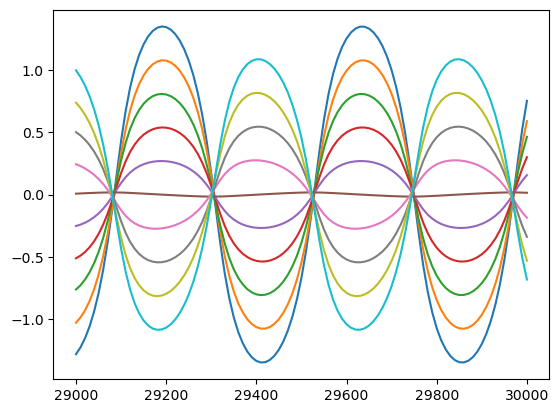

In [35]:
#Activity_X1_sorted

plt.plot(np.linspace(29000,30000, 101), Activity_X1_sorted[106, 2900:3001, 0:100:10])



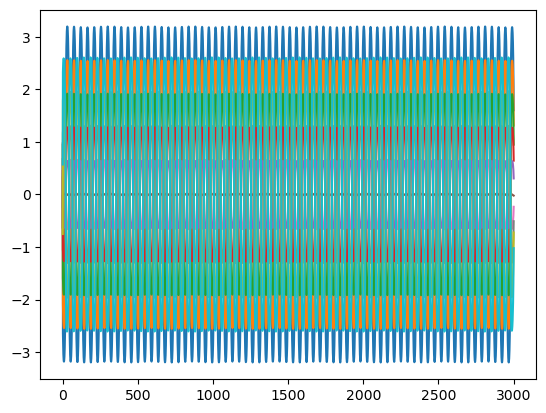

In [55]:

Activity_X2_sorted_weights_seed_2 = Activity_X2_sorted[Mask_weights_seed_2]

plt.plot(np.linspace(0,3001, 3001), Activity_X2_sorted_weights_seed_2[31, :3001, 0:100:10])

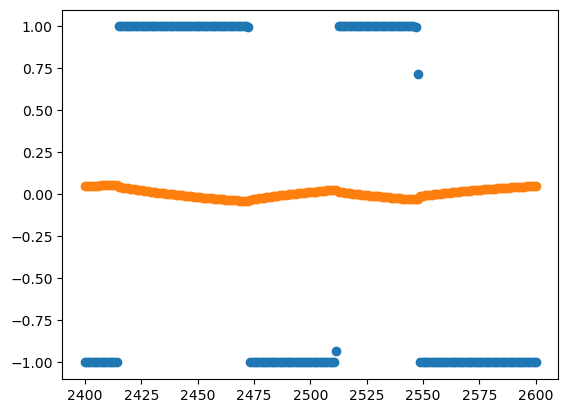

In [21]:
plt.plot(np.linspace(2400, 2600, 200), tanh(Activity_X2_sorted_weights_seed_2[36, 2400:2600, 0:100:50]),"o")

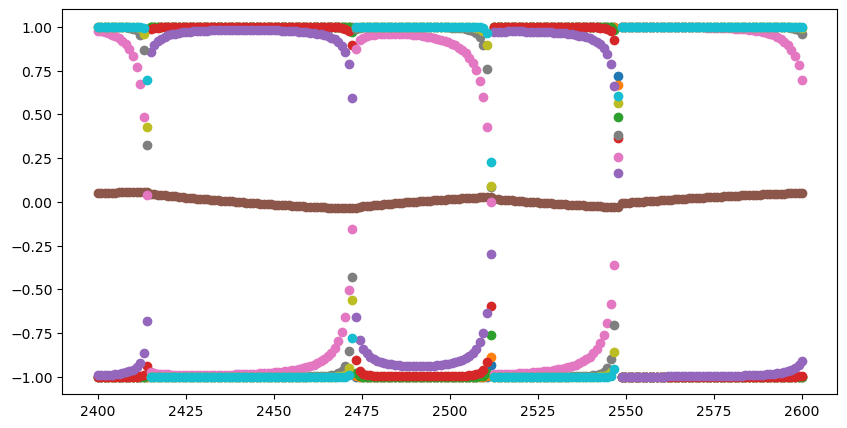

In [13]:
Activity_X2_sorted_weights_seed_2 = Activity_X2_sorted[Mask_weights_seed_2]

plt.figure(figsize=(10,5))

for i in range(0, 100, 10):
    plt.scatter(np.linspace(2400, 2600, 200), tanh(Activity_X2_sorted_weights_seed_2[36, 2400:2600, i]))

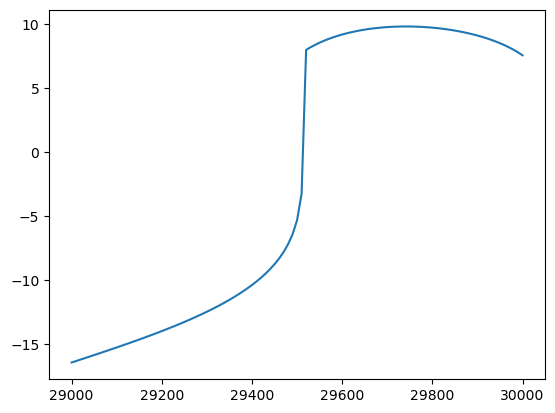

In [21]:
#Activity_X1_sorted

plt.plot(np.linspace(29000,30000, 101), Activity_X1_sorted_weights_seed_2[35, 2900:3001, 10])

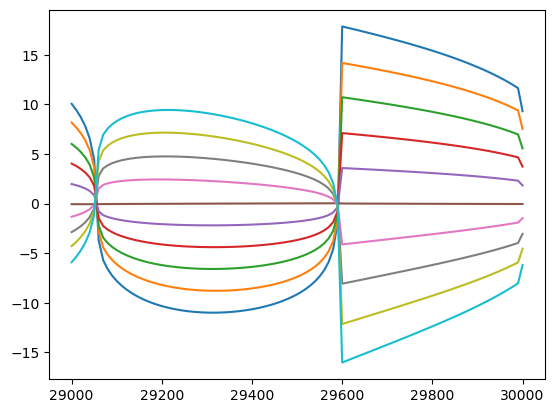

In [23]:

Activity_X2_sorted_weights_seed_2 = Activity_X2_sorted[Mask_weights_seed_2]

plt.plot(np.linspace(29000,30000, 101), Activity_X2_sorted_weights_seed_2[35, 2900:3001, 0:100:10])

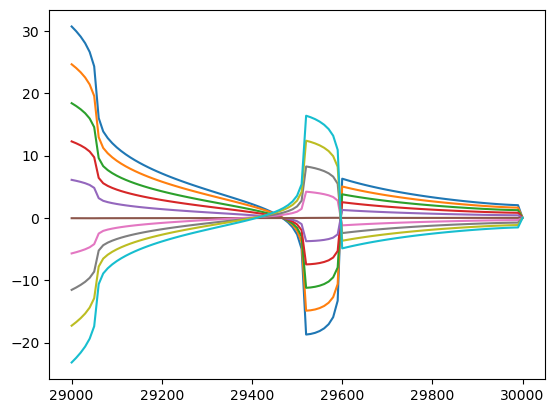

In [25]:
#DIFFERENCE

difference =  Activity_X2_sorted_weights_seed_2[35, 2900:3001, 0:100:10] -  Activity_X1_sorted_weights_seed_2[35, 2900:3001, 0:100:10]

plt.plot(np.linspace(29000,30000, 101), difference)

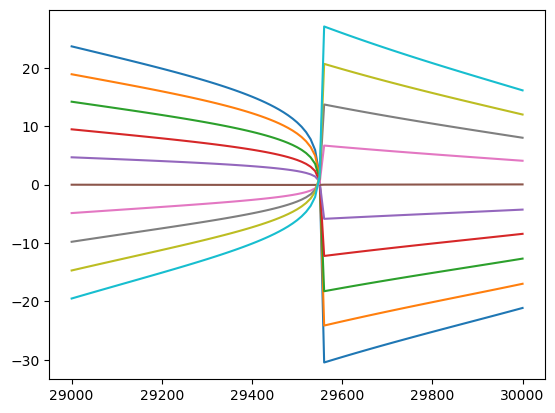

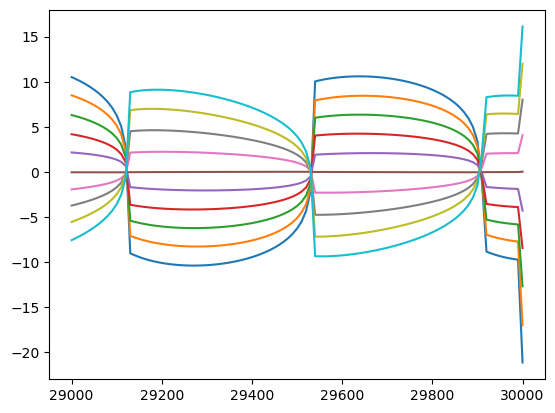

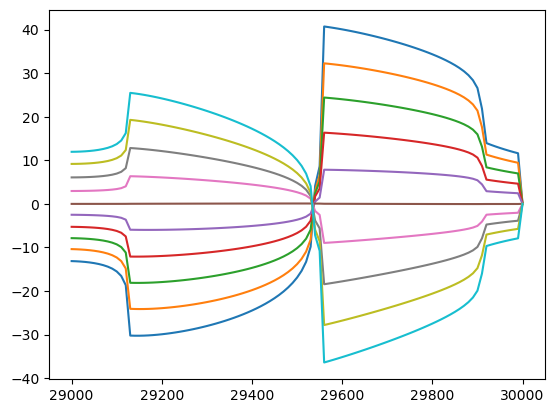

In [27]:
Mask_weights_seed_4 = Weights_Seeds_sorted == 4

Activity_X1_sorted_weights_seed_4 = Activity_X1_sorted[Mask_weights_seed_4]
Activity_X2_sorted_weights_seed_4 = Activity_X2_sorted[Mask_weights_seed_4]

plt.plot(np.linspace(29000,30000, 101), Activity_X1_sorted_weights_seed_4[35, 2900:3001, 0:100:10])
plt.show()
plt.plot(np.linspace(29000,30000, 101), Activity_X2_sorted_weights_seed_4[35, 2900:3001, 0:100:10])
plt.show()
difference_weights_seed_4 =  Activity_X2_sorted_weights_seed_4[35, 2900:3001, 0:100:10] -  Activity_X1_sorted_weights_seed_4[35, 2900:3001, 0:100:10]

plt.plot(np.linspace(29000,30000, 101), difference_weights_seed_4)

plt.show()

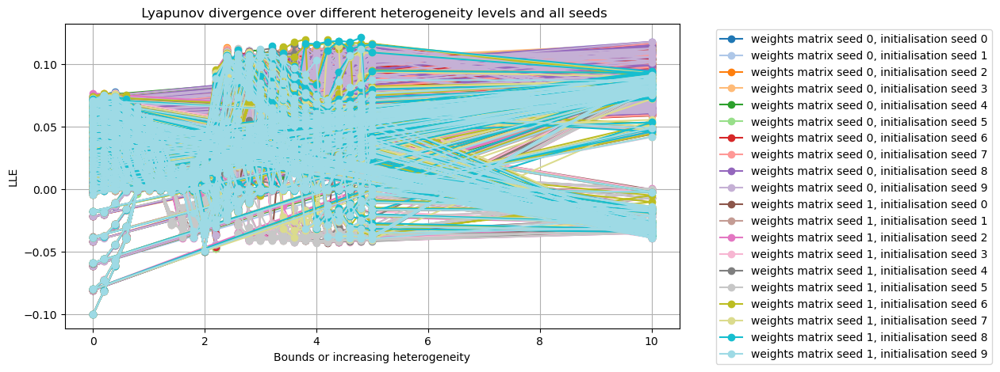

In [49]:

combination = np.vstack((Weights_Seeds_sorted, Initialisation_Seeds_sorted)) 
#print(f"combination {combination}")
Unique_seed_combos = np.unique(combination, axis=1)
#print(f"Unique_seed_combos {Unique_seed_combos}")
colors = plt.cm.tab20(np.linspace(0, 1, Unique_seed_combos.shape[1]))

plt.figure(figsize=(10,5))

for index in range(Unique_seed_combos.shape[1]):

    unique_combo = Unique_seed_combos[:, index] 
    #print(f"unique_combo {unique_combo}")
    
    mask = np.all(combination == unique_combo[:, None], axis = 0)
    #print(f" mask {mask}")

    bounds = MSHs_sorted[mask]
    #print(f"bounds {bounds}")
    
    LLEs = LLEs_sorted[mask]

    
    plt.plot(bounds, LLEs, 'o-', color=colors[index],  label=f'weights matrix seed {int(unique_combo[0])}, initialisation seed {int(unique_combo[1])}')
    
plt.xlabel("Bounds or increasing heterogeneity")
plt.ylabel("LLE")
plt.title(f" Lyapunov divergence over different heterogeneity levels and all seeds")
plt.grid(True)
plt.legend(bbox_to_anchor=(1.05, 1));

plt.show()

ValueError: not enough values to unpack (expected 2, got 1)

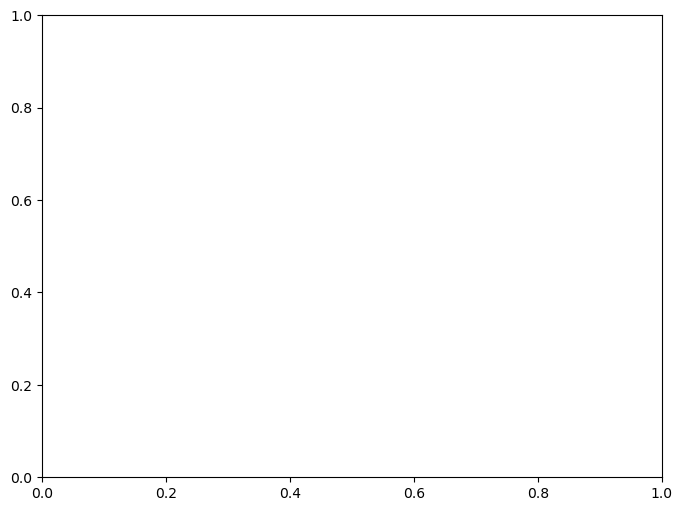

In [199]:
import numpy as np
import matplotlib.pyplot as plt

# Define axes
# MHS = np.arange(0, 5.2, 0.2)   # includes 5
# Gain = np.arange(0, 11, 1)      # includes 10

#LLEs_sorted23, Gains_sorted23, Weights_Seeds_sorted23, Initialisation_Seeds_sorted23, MSHs_sorted23 

MSHs = np.arange(0, 5.2, 0.2)
MSHs = np.append(MSHs, 10)
Gains = np.arange(0, 10.2, 0.2) 


# Create meshgrid
X, Y = np.meshgrid(MSHs, Gains)

# Example function to generate Z values (you can replace with your own data)
LLEs = LLEs_sorted

# Plot heatmap
plt.figure(figsize=(8, 6))
heatmap = plt.pcolormesh(X, Y, LLEs, shading="auto", cmap="viridis")
plt.colorbar(heatmap, label="Z value")

plt.xlabel("X axis (0 → 5)")
plt.ylabel("Y axis (0 → 10)")
plt.title("Heatmap Example")
plt.show()



In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Suppose you already have:
# G, W, I, H, L

#LLEs_sorted23, Gains_sorted23, Weights_Seeds_sorted23, Initialisation_Seeds_sorted23, MSHs_sorted23 

# Put them into a dataframe for grouping
df = pd.DataFrame({'G': Gains_sorted05, 'W': Weights_Seeds_sorted05, 'I': Initialisation_Seeds_sorted05, 'MSH': MSHs_sorted05, 'L': LLEs_sorted05})

# Average over W and I for each (G, H) combination
df_mean = df.groupby(['G', 'W', 'I', 'MSH'], as_index=False)['L'].mean()


# df_mean = df.groupby(['G', 'MSH'], as_index=False)['L'].mean()



NameError: name 'Gains_sorted05' is not defined

In [32]:
Gains_sorted.shape

(137700,)

# Heatmap creation and related tasks

In [67]:
PRs_sorted.shape


(135864,)

In [69]:
LLEs_sorted.shape

(137700,)

In [87]:
#multiplying MLE values with 1000 to get 1/s^-1 unit
# LLEs_sorted *= 1000

# mask = (MSHs_sorted != [0, 0.2, 0.4, 0.6, 10]) & (Gains_sorted != [0, 0.2, 0.4, 0.6, 0.8])
# mask_PR = (PR_MSHs_sorted != [0, 0.2, 0.4, 0.6, 10]) & (PR_Gains_sorted != [0, 0.2, 0.4, 0.6, 0.8])

mask = (
    ~np.isin(MSHs_sorted, [0, 0.2, 0.4, 0.6, 10])
) & (
    ~np.isin(Gains_sorted, [0, 0.2, 0.4, 0.6, 0.8])
)

mask_PR = (~np.isin(PR_MSHs_sorted, [0, 0.2, 0.4, 0.6, 10])
) & (
    ~np.isin(PR_Gains_sorted, [0, 0.2, 0.4, 0.6, 0.8])
)

# valid_MSHs = [0, 0.2, 0.4, 0.6]
# valid_Gains = [0, 0.2, 0.4, 0.6, 0.8]

# mask = ~(
#     (MSHs_sorted == 10) |
#     (
#         np.isin(MSHs_sorted, valid_MSHs) &
#         np.isin(Gains_sorted, valid_Gains)
#     )
# )

# mask_PR = ~(
#     (PR_MSHs_sorted == 10) |
#     (
#         np.isin(PR_MSHs_sorted, valid_MSHs) &
#         np.isin(PR_Gains_sorted, valid_Gains)
#     )
# )

Gains_sorted = Gains_sorted[mask]
Weights_Seeds_sorted = Weights_Seeds_sorted[mask]
Initialisation_Seeds_sorted = Initialisation_Seeds_sorted[mask]
MSHs_sorted = MSHs_sorted[mask]
LLEs_sorted = LLEs_sorted[mask]
PRs_sorted = PRs_sorted[mask_PR]


IndexError: boolean index did not match indexed array along dimension 0; dimension is 130866 but corresponding boolean dimension is 135864

44.140637471406095 0.9999999999997848


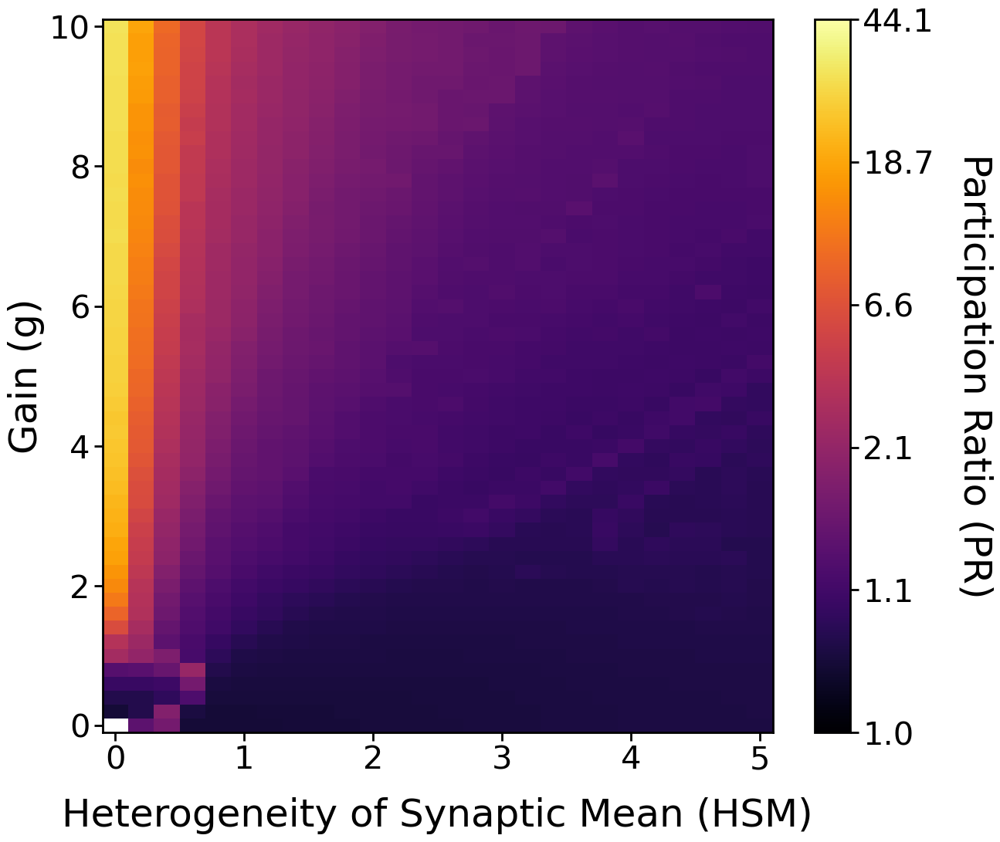

In [15]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import PowerNorm
import pandas as pd
import datetime
import os

# --- Set GLOBAL min/max for BOTH datasets ---
# GLOBAL_VMIN = 1.0  # or the minimum PR value across both datasets
# GLOBAL_VMAX = 45.1  # the maximum PR value across both datasets (from your 3000N case)

plt.rcParams['axes.titlesize'] = 30
plt.rcParams['axes.labelsize'] = 36
plt.rcParams['xtick.labelsize'] = 30
plt.rcParams['ytick.labelsize'] = 30
plt.rcParams['legend.fontsize'] = 36
plt.rcParams['figure.titlesize'] = 30
plt.rcParams['legend.title_fontsize'] = 30

#tick size:
plt.rcParams['xtick.major.size'] = 8    # length of major ticks
plt.rcParams['ytick.major.size'] = 8
plt.rcParams['xtick.major.width'] = 2  # width of major ticks
plt.rcParams['ytick.major.width'] = 2

mask = (PR_MSHs_sorted != 10) 

df = pd.DataFrame({
    'G': PR_Gains_sorted[mask],
    'W': PR_Weights_Seeds_sorted[mask],
    'I': PR_Initialisation_Seeds_sorted[mask],
    'MSH': PR_MSHs_sorted[mask],
    'PR': PRs_sorted[mask]
})

df_mean = df.groupby(['G', 'W', 'I', 'MSH'], as_index=False)['PR'].mean()
heatmap_data_PR = df_mean.pivot_table(index='G', columns='MSH', values='PR', aggfunc='mean')

# Set the (G=0, MSH=0) cell to NaN → will render as white
if 0 in heatmap_data_PR.index and 0 in heatmap_data_PR.columns:
    heatmap_data_PR.loc[0, 0] = np.nan


# for if you do not want to compare between 1000N and 3000N
GLOBAL_VMIN = df_mean['PR'].min()
GLOBAL_VMAX = df_mean['PR'].max()

print(GLOBAL_VMAX, GLOBAL_VMIN)

plt.figure(figsize=(14,12))

# Use GLOBAL vmin/vmax instead of data-specific min/max
norm = PowerNorm(
    gamma=0.25,
    vmin=GLOBAL_VMIN,  # Changed
    vmax=GLOBAL_VMAX   # Changed
)

cmap = plt.get_cmap('inferno').copy()
cmap.set_bad(color='white')

mesh = plt.pcolormesh(
    heatmap_data_PR.columns,
    heatmap_data_PR.index,
    heatmap_data_PR.values,
    cmap=cmap,
    norm=norm
)

cbar = plt.colorbar(mesh)
cbar.set_label('Participation Ratio (PR)', rotation=270, labelpad=20)
cbar.ax.yaxis.set_label_coords(5.0, 0.5)  # Adjust position if needed


cbar.ax.minorticks_off()

n_ticks = 6  
tick_positions = np.linspace(0, 1, n_ticks)

# Use GLOBAL values for tick calculation
data_min = GLOBAL_VMIN  # Changed
data_max = GLOBAL_VMAX  # Changed
gamma = 0.25
tick_values = data_min + (data_max - data_min) * (tick_positions ** (1/gamma))

rounded_labels = [f"{v:.01f}" for v in tick_values]

cbar.set_ticks(tick_values)
cbar.set_ticklabels(rounded_labels)

plt.xlabel('Heterogeneity of Synaptic Mean (HSM)', labelpad=20)
plt.ylabel('Gain (g)')

#plt.title('Dimensionality for 3000N, 3 W seeds x 2 I seeds')
#plt.title('Dimensionality for 1000N, 10 W seeds x 10 I seeds')

timestamp = datetime.datetime.now().strftime("%Y-%m-%d_ %H;%M;%S")
filename = f"PR_3000N_shortened_{timestamp}"
#filename = f"PR_1000N_0.2s_shortened_Map_gain_HSM_{timestamp}.png"

filepath = os.path.join(r"C:\Users\Lenovo\Documents\B. Master Neurophysics\Stage\Presentations and reports and code\code\PR\PR map PNGs for Gain and HSM", filename)

#filepath = os.path.join(r"C:\Users\Lenovo\Documents\B. Master Neurophysics\Stage\Presentations and reports and code\code\PR\PR map 3000N", filename)

#for increasing the width of the plot edge line
ax = plt.gca()
for spine in ax.spines.values():
    spine.set_linewidth(2)

#for increasing the width of the edge line of the colour bar
cbar.outline.set_linewidth(2)

plt.savefig(filepath, dpi=300)
plt.show()

0.13936189746415775 1.874740918260869e-08


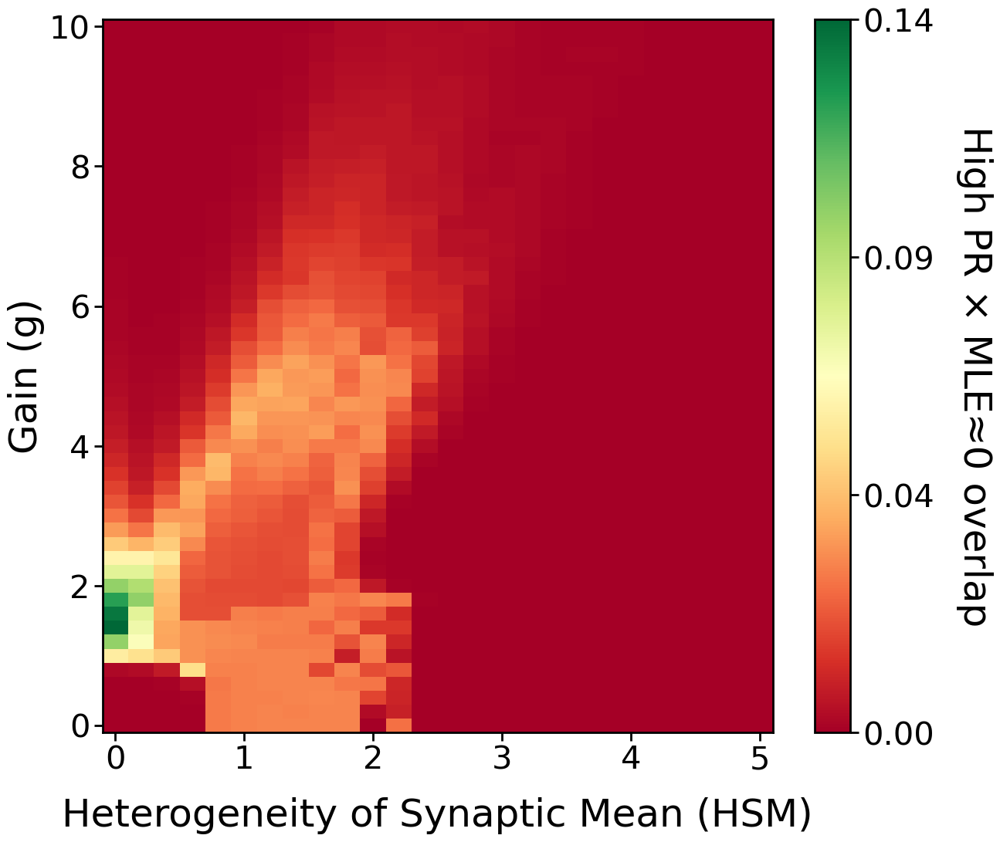

In [71]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import TwoSlopeNorm

# --------------------------------------------------
# 1) Remove MSH = 10 (as you did before)
# --------------------------------------------------

mask = (MSHs_sorted != 10)

# --------------------------------------------------
# 2) Build LLE dataframe + heatmap
# --------------------------------------------------

df_LLE = pd.DataFrame({
    'G': Gains_sorted[mask],
    'W': Weights_Seeds_sorted[mask],
    'I': Initialisation_Seeds_sorted[mask],
    'MSH': MSHs_sorted[mask],
    'LLE': LLEs_sorted[mask] * 1000  # convert to 1/s
})

df_LLE_mean = df_LLE.groupby(['G','W','I','MSH'], as_index=False)['LLE'].mean()

heatmap_LLE = df_LLE_mean.pivot_table(
    index='G',
    columns='MSH',
    values='LLE',
    aggfunc='mean'
)

# --------------------------------------------------
# 3) Build PR dataframe + heatmap
# --------------------------------------------------

mask_PR = (PR_MSHs_sorted != 10)

df_PR = pd.DataFrame({
    'G': PR_Gains_sorted[mask_PR],
    'W': PR_Weights_Seeds_sorted[mask_PR],
    'I': PR_Initialisation_Seeds_sorted[mask_PR],
    'MSH': PR_MSHs_sorted[mask_PR],
    'PR': PRs_sorted[mask_PR]
})

df_PR_mean = df_PR.groupby(['G','W','I','MSH'], as_index=False)['PR'].mean()

heatmap_PR = df_PR_mean.pivot_table(
    index='G',
    columns='MSH',
    values='PR',
    aggfunc='mean'
)

# --------------------------------------------------
# 4) Align both heatmaps to identical grid
# --------------------------------------------------

heatmap_LLE, heatmap_PR = heatmap_LLE.align(heatmap_PR)

# --------------------------------------------------
# 5) Convert to brightness measures
# --------------------------------------------------

# LLE: white = near zero
LLE_vals = heatmap_LLE.values
LLE_abs = np.abs(LLE_vals)

decay_strength = 7
LLE_weight = np.exp(-(LLE_abs / decay_strength)) 

#LLE_brightness = 1 - (LLE_abs / np.nanmax(LLE_abs))
# LLE_brightness = 1 - (LLE_abs)

# PR: yellow = high PR
PR_vals = heatmap_PR.values
#PR_brightness = PR_vals 
PR_brightness = PR_vals / np.nanmax(PR_vals)

# --------------------------------------------------
# 6) Overlap score
# --------------------------------------------------

# to make the dimensionality less important for the overlap, because our complex periodic benefits from dimensionality not higher than 20 (just nattevinger werk) we need to 
# make it less strong by a factor of 20/44.1(i.e. maximum dimensionality) = 0.454
overlap = LLE_weight * PR_brightness

gamma = 0.95
overlap_gamma = overlap ** gamma

# --------------------------------------------------
# 7) Plot overlap heatmap
# --------------------------------------------------

plt.figure(figsize=(14,12))

# Custom colormap
dark_red = "#8B0000"
white = "white"
dark_green = "#013220"

dark_red      = "#8B0000"
firebrick     = "#B22222"
crimson       = "#DC143C"
indian_red    = "#CD5C5C"
light_coral   = "#F08080"
salmon        = "#FA8072"
tomato        = "#FF6347"
red           = "#FF0000"

gold          = "#FFD700"
dark_golden   = "#B8860B"
lemon         = "#FFF44F"

dark_orange     = "#FF8C00"
burnt_orange    = "#CC5500"
chocolate       = "#D2691E"
sienna          = "#A0522D"
coral           = "#FF7F50"
orange_red      = "#FF4500"
orange          = "#FFA500"


dark_green    = "#013220"
forest_green  = "#228B22"
sea_green     = "#2E8B57"
olive         = "#808000"
olive_drab    = "#6B8E23"
lime_green    = "#32CD32"
lime          = "#00FF00"
light_green   = "#90EE90"


colors = [firebrick, gold, "xkcd:green"]  # for test after training
colors_averages = [red, lemon, "xkcd:green"] #for during training performance plot

n_bins = 100
cmap_name = 'custom_seismic'
cm = LinearSegmentedColormap.from_list(cmap_name, colors_averages, N=n_bins)

# for if you do not want to compare between 1000N and 3000N
GLOBAL_VMIN = overlap.min()
GLOBAL_VMAX = overlap.max()

print(GLOBAL_VMAX, GLOBAL_VMIN)

# Use GLOBAL vmin/vmax instead of data-specific min/max
norm = PowerNorm(
    gamma=gamma,
    vmin=GLOBAL_VMIN,  # Changed
    vmax=GLOBAL_VMAX   # Changed
)

mesh = plt.pcolormesh(
    heatmap_LLE.columns,
    heatmap_LLE.index,
    overlap,
    shading='auto',
    cmap='RdYlGn',
    norm=norm
)





cmap = plt.get_cmap('inferno').copy()
cmap.set_bad(color='white')

cbar = plt.colorbar(mesh)
cbar.set_label("High PR × MLE≈0 overlap", rotation=270, labelpad=50)

cbar.ax.yaxis.set_label_coords(5.0, 0.5)  # Adjust position if needed


cbar.ax.minorticks_off()

n_ticks = 4
tick_positions = np.linspace(0, 1, n_ticks)

# Use GLOBAL values for tick calculation
data_min = GLOBAL_VMIN  # Changed
data_max = GLOBAL_VMAX  # Changed
gamma = gamma
tick_values = data_min + (data_max - data_min) * (tick_positions ** (1/gamma))

rounded_labels = [f"{v:.02f}" for v in tick_values]

cbar.set_ticks(tick_values)
cbar.set_ticklabels(rounded_labels)

plt.xlabel('Heterogeneity of Synaptic Mean (HSM)', labelpad = 20)
plt.ylabel('Gain (g)')

# plt.title('Overlap: High Dimensionality & Near-Critical Dynamics')

#for increasing the width of the plot edge line
ax = plt.gca()
for spine in ax.spines.values():
    spine.set_linewidth(2)

#for increasing the width of the edge line of the colour bar
cbar.outline.set_linewidth(2)

timestamp = datetime.datetime.now().strftime("%Y-%m-%d_ %H;%M;%S")
filename = f"Overlap_MLE_PR_{timestamp}"
#filename = f"PR_1000N_0.2s_shortened_Map_gain_HSM_{timestamp}.png"

filepath = os.path.join(r"C:\Users\Lenovo\Documents\B. Master Neurophysics\Stage\Presentations and reports and code\code\PR\PR map PNGs for Gain and HSM", filename)

plt.savefig(filepath, dpi=300)
plt.show()

In [79]:
# --- Normalize PR ---
PR_max = np.nanmax(PRs_sorted)
PR_norm = PRs_sorted / PR_max

# --- Measure closeness of LLE to zero ---
LLE_scale = 10  # sensitivity (smaller = sharper around 0)
LLE_closeness = np.exp(-np.abs(LLEs_sorted) / LLE_scale)

# --- Correspondence score ---
Correspondence = LLE_closeness * PR_norm

ValueError: operands could not be broadcast together with shapes (132600,) (130866,) 

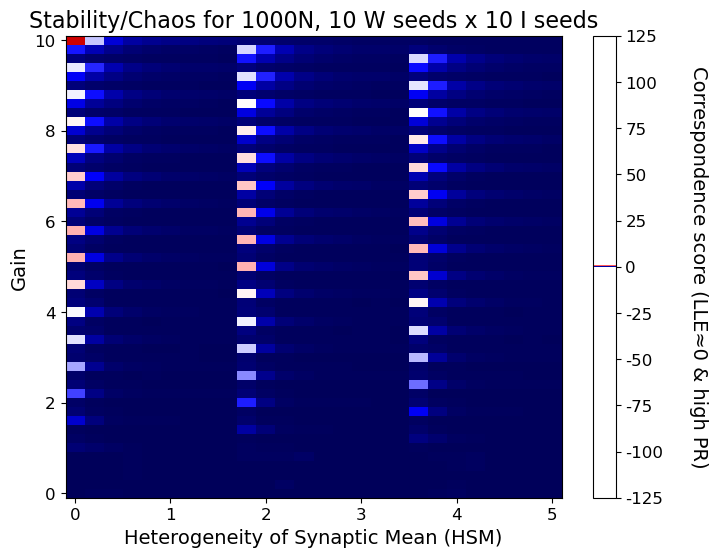

In [115]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap, TwoSlopeNorm
import pandas as pd
import datetime
import os

# --- Set GLOBAL min/max for BOTH datasets (symmetric around 0) ---
GLOBAL_VMAX = 125  # Set this to the maximum absolute MLE value across BOTH datasets
GLOBAL_VMIN = -GLOBAL_VMAX  # Symmetric around 0

# Your existing code...
plt.rcParams['axes.titlesize'] = 16
plt.rcParams['axes.labelsize'] = 14
plt.rcParams['xtick.labelsize'] = 12
plt.rcParams['ytick.labelsize'] = 12
plt.rcParams['legend.fontsize'] = 10
plt.rcParams['figure.titlesize'] = 16
plt.rcParams['legend.title_fontsize'] = 14

# Create custom colormap: Blue -> White -> Red
dark_red = "#8B0000"
white = "white"
dark_blue = "#013220"

colors = [dark_blue, white, dark_red]
n_bins = 251
cmap_name = 'custom_seismic'
cm = LinearSegmentedColormap.from_list(cmap_name, colors, N=n_bins)

# MSHs_sorted = MSHs_sorted[:135864]
# Gains_sorted = Gains_sorted[:135864]
# Weights_Seeds_sorted = Weights_Seeds_sorted[:135864]
# Initialisation_Seeds_sorted = Initialisation_Seeds_sorted[:135864]
# LLEs_sorted = LLEs_sorted[:135864]


# mask = (MSHs_sorted != 10) 

# df = pd.DataFrame({
#     'G': Gains_sorted[mask],
#     'W': Weights_Seeds_sorted[mask],
#     'I': Initialisation_Seeds_sorted[mask],
#     'MSH': MSHs_sorted[mask],
#     'LLE': LLEs_sorted[mask],
#     'PR': PRs_sorted[mask],
#     'Score': Correspondence[mask]
# })

df = pd.DataFrame({
    'G': Gains_sorted,
    'W': Weights_Seeds_sorted,
    'I': Initialisation_Seeds_sorted,
    'MSH': MSHs_sorted,
    'LLE': LLEs_sorted,
    'PR': PRs_sorted,
    'Score': Correspondence
})

df_mean = df.groupby(['G', 'W', 'I', 'MSH'], as_index=False)['Score'].mean()
heatmap_data = df_mean.pivot_table(index='G', columns='MSH', values='Score', aggfunc='mean')


# Create a norm that centers at 0 with GLOBAL limits
norm = plt.Normalize(vmin=0, vmax=1)


plt.figure(figsize=(8,6))
mesh = plt.pcolormesh(
    heatmap_data.columns, 
    heatmap_data.index, 
    heatmap_data.values,
    shading='auto', 
    cmap='seismic',  # Use custom colormap
    norm=norm  # Use centered normalization
)

cbar = plt.colorbar(mesh, label='Maximal Lyapunov Exponent (MLE) ($s^{-1}$)')
cbar.ax.yaxis.set_label_coords(5.0, 0.5)  # Adjust position if needed
cbar.set_label('Correspondence score (LLE≈0 & high PR)', rotation=270, labelpad=20)


# Create evenly spaced ticks from GLOBAL_VMIN to GLOBAL_VMAX
n_ticks = 11  # Adjust number of ticks as needed
tick_values = np.linspace(GLOBAL_VMIN, GLOBAL_VMAX, n_ticks)
cbar.set_ticks(tick_values)
cbar.set_ticklabels([f'{v:.0f}' for v in tick_values])

plt.xlabel('Heterogeneity of Synaptic Mean (HSM)')
plt.ylabel('Gain')
plt.title('Stability/Chaos for 1000N, 10 W seeds x 10 I seeds')

#plt.title('Stability/Chaos for 3000N, 3 Wseeds x 2 Iseeds')

timestamp = datetime.datetime.now().strftime("%Y-%m-%d_ %H;%M;%S")
filename = f"MLE_Map_gain_HSM_{timestamp}.png"
filepath = os.path.join(r"C:\Users\Lenovo\Documents\B. Master Neurophysics\Stage\Presentations and reports and code\code\LLE\MLE map PNGs for Gain and HSM", filename)

#filepath = os.path.join(r"C:\Users\Lenovo\Documents\B. Master Neurophysics\Stage\Presentations and reports and code\code\LLE\MLE map 3000N", filename)


plt.savefig(filepath, dpi=300)
plt.show()

In [19]:
#multiplying MLE values with 1000 to get 1/s^-1 unit
LLEs_sorted *= 1000

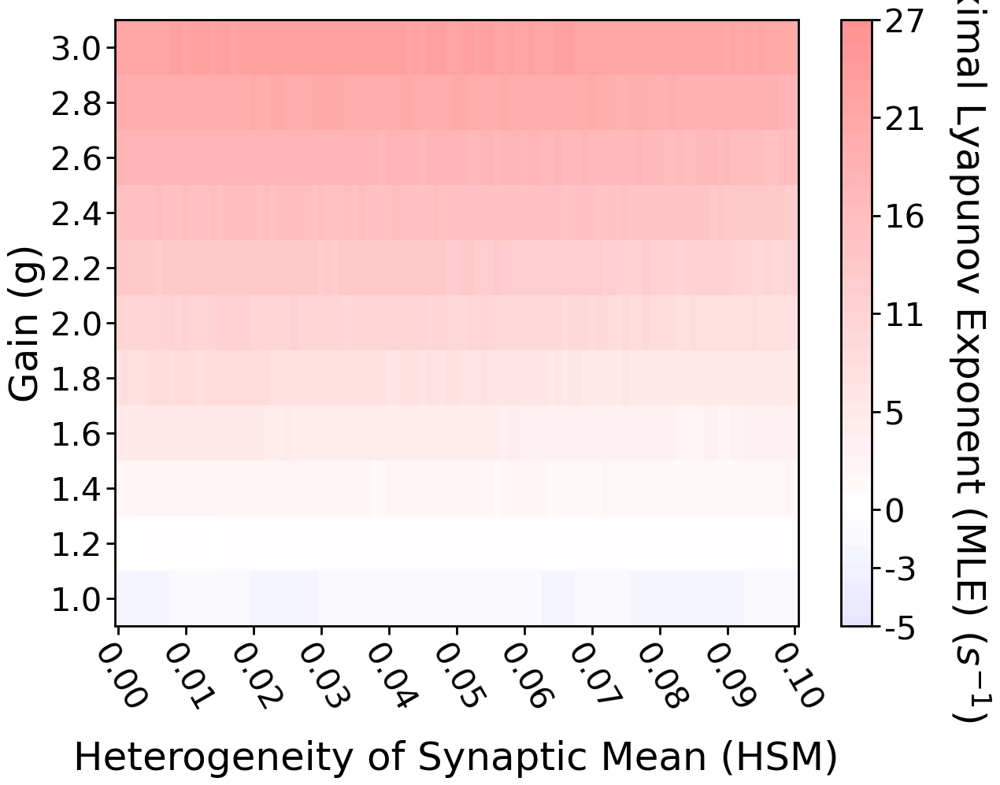

In [55]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap, TwoSlopeNorm
import pandas as pd
import datetime
import os

from matplotlib.ticker import MaxNLocator

# # --- Set GLOBAL min/max for BOTH datasets (symmetric around 0) ---
# GLOBAL_VMAX = 125  # Set this to the maximum absolute MLE value across BOTH datasets
# GLOBAL_VMIN = -GLOBAL_VMAX  # Symmetric around 0

plt.rcParams['axes.titlesize'] = 30
plt.rcParams['axes.labelsize'] = 36
plt.rcParams['xtick.labelsize'] = 30
plt.rcParams['ytick.labelsize'] = 30
plt.rcParams['legend.fontsize'] = 36
plt.rcParams['figure.titlesize'] = 30
plt.rcParams['legend.title_fontsize'] = 30

#tick size:
plt.rcParams['xtick.major.size'] = 8    # length of major ticks
plt.rcParams['ytick.major.size'] = 8
plt.rcParams['xtick.major.width'] = 2  # width of major ticks
plt.rcParams['ytick.major.width'] = 2



# Create custom colormap: Blue -> White -> Red
dark_red = "#8B0000"
white = "white"
dark_blue = "#013220"

colors = [dark_blue, white, dark_red]
n_bins = 251
cmap_name = 'custom_seismic'
cm = LinearSegmentedColormap.from_list(cmap_name, colors, N=n_bins)




mask = (MSHs_sorted != 10) 

df = pd.DataFrame({
    'G': Gains_sorted[mask],
    'W': Weights_Seeds_sorted[mask],
    'I': Initialisation_Seeds_sorted[mask],
    'MSH': MSHs_sorted[mask],
    'L': LLEs_sorted[mask]
})

df_mean = df.groupby(['G', 'W', 'I', 'MSH'], as_index=False)['L'].mean()
heatmap_data = df_mean.pivot_table(index='G', columns='MSH', values='L', aggfunc='mean')

# Set the (G=0, MSH=0) cell to NaN → will render as white
if 0 in heatmap_data.index and 0 in heatmap_data.columns:
    heatmap_data.loc[0, 0] = np.nan

Universe_VMAX = 125
Universe_VMIN = -100

# for if you do not want to compare between 1000N and 3000N
GLOBAL_VMIN = df_mean['L'].min()
GLOBAL_VMAX = df_mean['L'].max()


# Create a norm that centers at 0 with GLOBAL limits
norm = TwoSlopeNorm(vmin=Universe_VMIN, 
                    vcenter=0, 
                    vmax=Universe_VMAX)

plt.figure(figsize=(14,10))

cmap = plt.get_cmap('seismic').copy()
cmap.set_bad(color='white')

mesh = plt.pcolormesh(
    heatmap_data.columns, 
    heatmap_data.index, 
    heatmap_data.values,
    shading='auto', 
    cmap=cmap,  # Use custom colormap
    norm=norm  # Use centered normalization
)

cbar = plt.colorbar(mesh, label='Maximal Lyapunov Exponent (MLE) ($s^{-1}$)')
cbar.ax.yaxis.set_label_coords(5.0, 0.5)  # Adjust position if needed
cbar.set_label('Maximal Lyapunov Exponent (MLE) ($s^{-1}$)', rotation=270, labelpad=20)


# Crop colorbar display to local data range (norm stays global)
local_min = df_mean['L'].min()
local_max = df_mean['L'].max()

# Convert local data values to norm space (0-1) for the colorbar axis
norm_min = norm(local_min)
norm_max = norm(local_max)

cbar.ax.set_ylim(norm_min, norm_max)

# Ticks within local range only
n_ticks_per_side = 5
neg_ticks = np.linspace(local_min, 0, 2 + 1)
pos_ticks = np.linspace(0, local_max, n_ticks_per_side + 1)
tick_values = np.unique(np.concatenate([neg_ticks, pos_ticks]))

cbar.set_ticks(tick_values)
cbar.set_ticklabels([f'{v:.0f}' for v in tick_values])


plt.xlabel('Heterogeneity of Synaptic Mean (HSM)', labelpad=20)
plt.ylabel('Gain (g)')
# plt.title('Stability/Chaos for 1000N, 10 W seeds x 10 I seeds')

#plt.title('Stability/Chaos for 3000N, 3 Wseeds x 2 Iseeds')

timestamp = datetime.datetime.now().strftime("%Y-%m-%d_ %H;%M;%S")
filename = f"MLE_Map_gain_HSM_{timestamp}.png"
filepath = os.path.join(r"C:\Users\Lenovo\Documents\B. Master Neurophysics\Stage\Presentations and reports and code\code\LLE\MLE map PNGs for Gain and HSM", filename)

#filepath = os.path.join(r"C:\Users\Lenovo\Documents\B. Master Neurophysics\Stage\Presentations and reports and code\code\LLE\MLE map 3000N", filename)

ax = plt.gca()
ax.tick_params(axis='x', rotation=300)

#for increasing the width of the plot edge line
ax = plt.gca()
for spine in ax.spines.values():
    spine.set_linewidth(2)

ax.xaxis.set_major_locator(MaxNLocator(nbins=11))
ax.yaxis.set_major_locator(MaxNLocator(nbins=11))

#for increasing the width of the edge line of the colour bar
cbar.outline.set_linewidth(2)

plt.savefig(filepath, dpi=300)
plt.show()

<>:74: SyntaxWarning: invalid escape sequence '\s'
<>:74: SyntaxWarning: invalid escape sequence '\s'
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_11900\3899300312.py:74: SyntaxWarning: invalid escape sequence '\s'
  cbar.set_label('standard deviation ($\sigma$) of MLE', rotation=270, labelpad=20)


5.09743821595756 0.3712331882644998


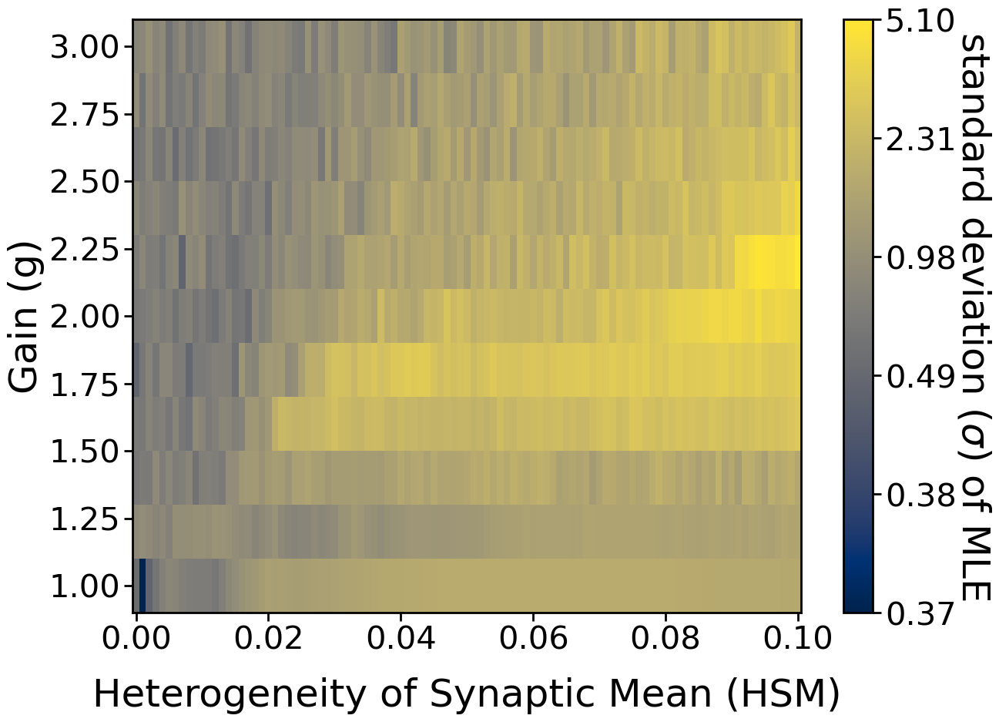

In [57]:
#Std heatmap

plt.rcParams['axes.titlesize'] = 30
plt.rcParams['axes.labelsize'] = 36
plt.rcParams['xtick.labelsize'] = 30
plt.rcParams['ytick.labelsize'] = 30
plt.rcParams['legend.fontsize'] = 36
plt.rcParams['figure.titlesize'] = 30
plt.rcParams['legend.title_fontsize'] = 30

#tick size:
plt.rcParams['xtick.major.size'] = 8    # length of major ticks
plt.rcParams['ytick.major.size'] = 8
plt.rcParams['xtick.major.width'] = 2  # width of major ticks
plt.rcParams['ytick.major.width'] = 2


mask = (MSHs_sorted != 10) 

# Put them into a DataFrame
df = pd.DataFrame({
    'G': Gains_sorted[mask],
    'W': Weights_Seeds_sorted[mask],
    'I': Initialisation_Seeds_sorted[mask],
    'MSH': MSHs_sorted[mask],
    'L': LLEs_sorted[mask]
})



# Average over W and I for each (G, MSH) combination
# (If you want to ignore W and I completely, comment the line below and uncomment the next one)
#df_mean = df.groupby(['G', 'MSH'], as_index=False)['L'].mean()
df_mean = df.groupby(['G', 'W', 'I', 'MSH'], as_index=False)['L'].mean()
df_std = df_mean.groupby(['G', 'MSH'], as_index=False)['L'].std()


heatmap_data = df_std.pivot_table(index='G', columns='MSH', values='L', aggfunc='mean')


# Set the (G=0, MSH=0) cell to NaN → will render as white
if 0 in heatmap_data.index and 0 in heatmap_data.columns:
    heatmap_data.loc[0, 0] = np.nan


# for if you do not want to compare between 1000N and 3000N
GLOBAL_VMIN = df_std['L'].min()
GLOBAL_VMAX = df_std['L'].max()

print(GLOBAL_VMAX, GLOBAL_VMIN)

plt.figure(figsize=(14,10))

# Use GLOBAL vmin/vmax instead of data-specific min/max
norm = PowerNorm(
    gamma=0.25,
    vmin=GLOBAL_VMIN,  # Changed
    vmax=GLOBAL_VMAX   # Changed
)

cmap = plt.get_cmap('cividis').copy()
cmap.set_bad(color='white')

mesh = plt.pcolormesh(
    heatmap_data.columns,
    heatmap_data.index,
    heatmap_data.values,
    shading='auto',
    cmap=cmap,
    norm=norm
)

cbar = plt.colorbar(mesh)
cbar.set_label('standard deviation ($\sigma$) of MLE', rotation=270, labelpad=20)
cbar.ax.yaxis.set_label_coords(5.0, 0.5)  # Adjust position if needed


cbar.ax.minorticks_off()

n_ticks = 6  
tick_positions = np.linspace(0, 1, n_ticks)

# Use GLOBAL values for tick calculation
data_min = GLOBAL_VMIN  # Changed
data_max = GLOBAL_VMAX  # Changed
gamma = 0.25
tick_values = data_min + (data_max - data_min) * (tick_positions ** (1/gamma))

rounded_labels = [f"{v:.02f}" for v in tick_values]

cbar.set_ticks(tick_values)
cbar.set_ticklabels(rounded_labels)



# plt.pcolormesh(heatmap_data.columns, heatmap_data.index, heatmap_data.values,
#                shading='auto', cmap='inferno')
# plt.colorbar(label='$\sigma$ of PR')
plt.xlabel('Heterogeneity of Synaptic Mean (HSM)', labelpad = 20)
plt.ylabel('Gain (g)')
# plt.title('Uncertainty of PR')
# plt.title('Heatmap of MLEs vs MSHs per Gains')

#for increasing the width of the plot edge line
ax = plt.gca()
for spine in ax.spines.values():
    spine.set_linewidth(2)

#for increasing the width of the edge line of the colour bar
cbar.outline.set_linewidth(2)

timestamp = datetime.datetime.now().strftime("%Y-%m-%d_ %H;%M;%S")
filename = f"LLE_1000N_0.2s_shortened_uncertainty_{timestamp}.png"
filepath = os.path.join(r"C:\Users\Lenovo\Documents\B. Master Neurophysics\Stage\Presentations and reports and code\code\LLE\MLE map PNGs for Gain and HSM", filename)
plt.savefig(filepath, dpi=300)

plt.show()

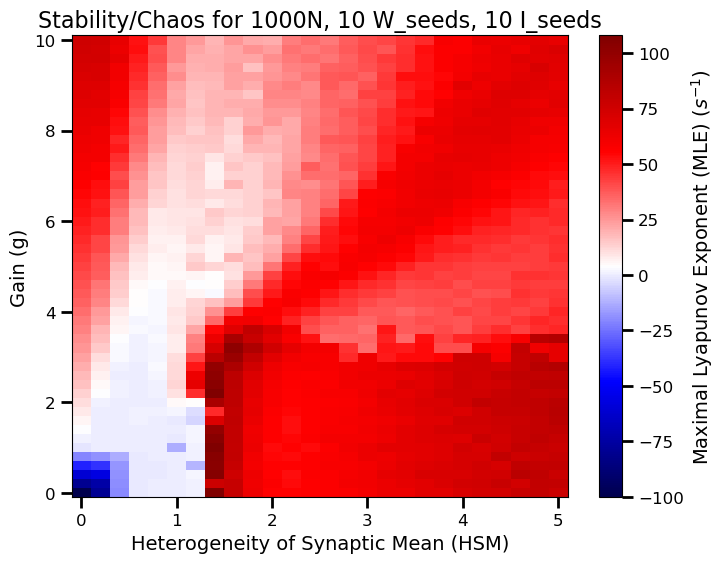

In [51]:
#this one works
plt.rcParams['axes.titlesize'] = 16
plt.rcParams['axes.labelsize'] = 14    # x/y labels
plt.rcParams['xtick.labelsize'] = 12   # x ticks
plt.rcParams['ytick.labelsize'] = 12   # y ticks
plt.rcParams['legend.fontsize'] = 10   # legend text
plt.rcParams['figure.titlesize'] = 16  # suptitle (global title)
plt.rcParams['legend.title_fontsize'] = 14 # legend title




dark_red = "#8B0000"
white = "white"
dark_green = "#013220"

colors = [dark_green, white, dark_red] # Blue -> White -> Red

# Create the colormap from a list of colors
n_bins = 100  # Number of color levels
cmap_name = 'custom_seismic'
cm = LinearSegmentedColormap.from_list(cmap_name, colors, N=n_bins)

mask = (MSHs_sorted != 10) 

# Put them into a DataFrame
df = pd.DataFrame({
    'G': Gains_sorted[mask],
    'W': Weights_Seeds_sorted[mask],
    'I': Initialisation_Seeds_sorted[mask],
    'MSH': MSHs_sorted[mask],
    'L': LLEs_sorted[mask]
})

# Average over W and I for each (G, MSH) combination
# (If you want to ignore W and I completely, comment the line below and uncomment the next one)
#df_mean = df.groupby(['G', 'MSH'], as_index=False)['L'].mean()
df_mean = df.groupby(['G', 'W', 'I', 'MSH'], as_index=False)['L'].mean()

heatmap_data = df_mean.pivot_table(index='G', columns='MSH', values='L', aggfunc='mean')

plt.figure(figsize=(8,6))
plt.pcolormesh(heatmap_data.columns, heatmap_data.index, heatmap_data.values,
               shading='auto', cmap='seismic')
plt.colorbar(label='Maximal Lyapunov Exponent (MLE) ($s^{-1}$)')
plt.xlabel('Heterogeneity of Synaptic Mean (HSM)')
plt.ylabel('Gain (g)')
plt.title('Stability/Chaos for 1000N, 10 W_seeds, 10 I_seeds')

timestamp = datetime.datetime.now().strftime("%Y-%m-%d_ %H;%M;%S")

# Save figure
filename = f"MLE_Map_gain_HSM_{timestamp}.png"
#change path depending on 10% connectivity or not
filepath = os.path.join(r"C:\Users\Lenovo\Documents\B. Master Neurophysics\Stage\Presentations and reports and code\code\LLE\MLE map PNGs for Gain and HSM", filename)
#plt.subplots_adjust(right=0.8) #leaving space for legend
plt.savefig(filepath, dpi = 300)

plt.show()


<>:26: SyntaxWarning: invalid escape sequence '\s'
<>:26: SyntaxWarning: invalid escape sequence '\s'
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_13916\2751762279.py:26: SyntaxWarning: invalid escape sequence '\s'
  plt.colorbar(label='$\sigma$ of MLE')


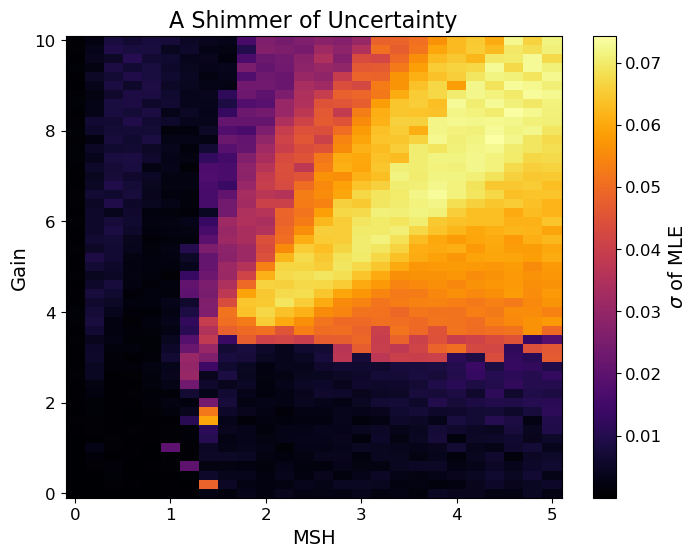

In [25]:
#Std heatmap

mask = (MSHs_sorted != 10) 

# Put them into a DataFrame
df = pd.DataFrame({
    'G': Gains_sorted[mask],
    'W': Weights_Seeds_sorted[mask],
    'I': Initialisation_Seeds_sorted[mask],
    'MSH': MSHs_sorted[mask],
    'L': LLEs_sorted[mask]
})

# Average over W and I for each (G, MSH) combination
# (If you want to ignore W and I completely, comment the line below and uncomment the next one)
#df_mean = df.groupby(['G', 'MSH'], as_index=False)['L'].mean()
df_mean = df.groupby(['G', 'W', 'I', 'MSH'], as_index=False)['L'].mean()
df_std = df_mean.groupby(['G', 'MSH'], as_index=False)['L'].std()


heatmap_data = df_std.pivot_table(index='G', columns='MSH', values='L', aggfunc='mean')

plt.figure(figsize=(8,6))
plt.pcolormesh(heatmap_data.columns, heatmap_data.index, heatmap_data.values,
               shading='auto', cmap='inferno')
plt.colorbar(label='$\sigma$ of MLE')
plt.xlabel('MSH')
plt.ylabel('Gain')
plt.title('A Shimmer of Uncertainty')
# plt.title('Heatmap of MLEs vs MSHs per Gains')
plt.show()

In [11]:
len(Weights_Seeds_sorted)

unique_Gains = np.unique(Gains_sorted)
print(unique_Gains)

unique_MSHs = np.unique(MSHs_sorted)

print(unique_MSHs)

# Colors for weight seeds


weights_seeds = np.unique(Weights_Seeds_sorted)
print(weights_seeds)

color_map = {ws: plt.cm.tab10(i % 10) for i, ws in enumerate(weights_seeds)}

# Linestyles for initialisation seeds
init_seeds_unique = np.unique(Initialisation_Seeds_sorted)
print(init_seeds_unique)


[1.  1.2 1.4 1.6 1.8 2.  2.2 2.4 2.6 2.8 3. ]
[0.    0.001 0.002 0.003 0.004 0.005 0.006 0.007 0.008 0.009 0.01  0.011
 0.012 0.013 0.014 0.015 0.016 0.017 0.018 0.019 0.02  0.021 0.022 0.023
 0.024 0.025 0.026 0.027 0.028 0.029 0.03  0.031 0.032 0.033 0.034 0.035
 0.036 0.037 0.038 0.039 0.04  0.041 0.042 0.043 0.044 0.045 0.046 0.047
 0.048 0.049 0.05  0.051 0.052 0.053 0.054 0.055 0.056 0.057 0.058 0.059
 0.06  0.061 0.062 0.063 0.064 0.065 0.066 0.067 0.068 0.069 0.07  0.071
 0.072 0.073 0.074 0.075 0.076 0.077 0.078 0.079 0.08  0.081 0.082 0.083
 0.084 0.085 0.086 0.087 0.088 0.089 0.09  0.091 0.092 0.093 0.094 0.095
 0.096 0.097 0.098 0.099 0.1  ]
[5 6 7 8 9]
[0 1 2 3]


[ 0.   0.2  0.4  0.6  0.8  1.   1.2  1.4  1.6  1.8  2.   2.2  2.4  2.6
  2.8  3.   3.2  3.4  3.6  3.8  4.   4.2  4.4  4.6  4.8  5.   5.2  5.4
  5.6  5.8  6.   6.2  6.4  6.6  6.8  7.   7.2  7.4  7.6  7.8  8.   8.2
  8.4  8.6  8.8  9.   9.2  9.4  9.6  9.8 10. ]
[ 0.   0.2  0.4  0.6  0.8  1.   1.2  1.4  1.6  1.8  2.   2.2  2.4  2.6
  2.8  3.   3.2  3.4  3.6  3.8  4.   4.2  4.4  4.6  4.8  5.  10. ]
[0 1 2 3 4 5 6 7 8 9]
[0 1 2 3 4 5 6 7 8 9]


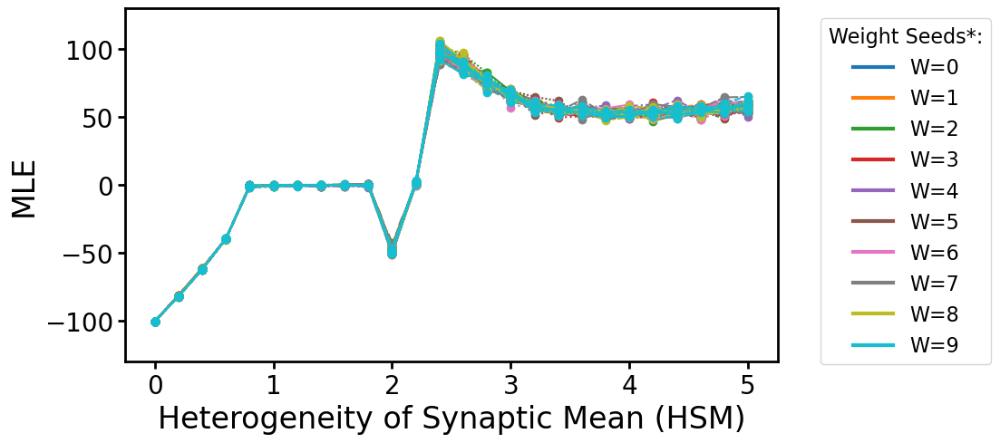

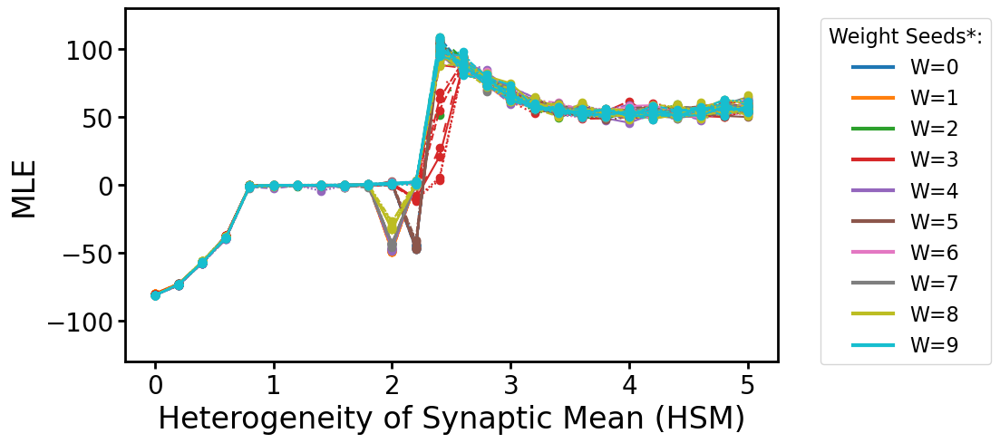

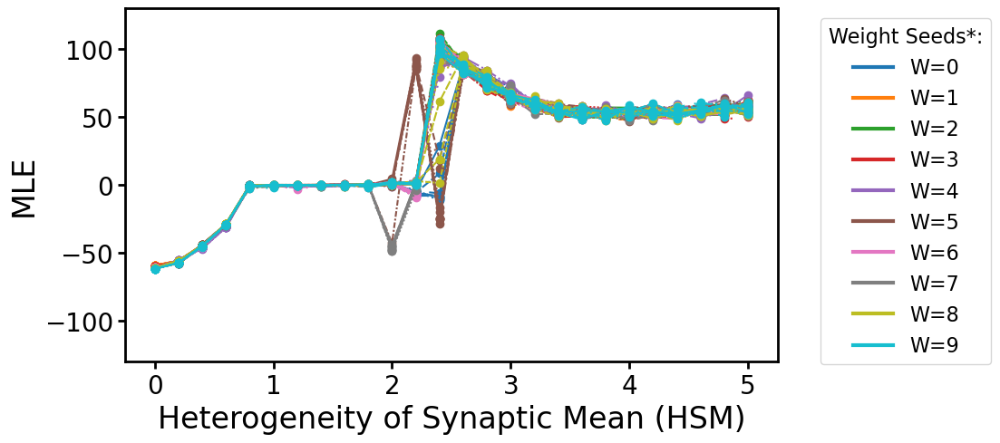

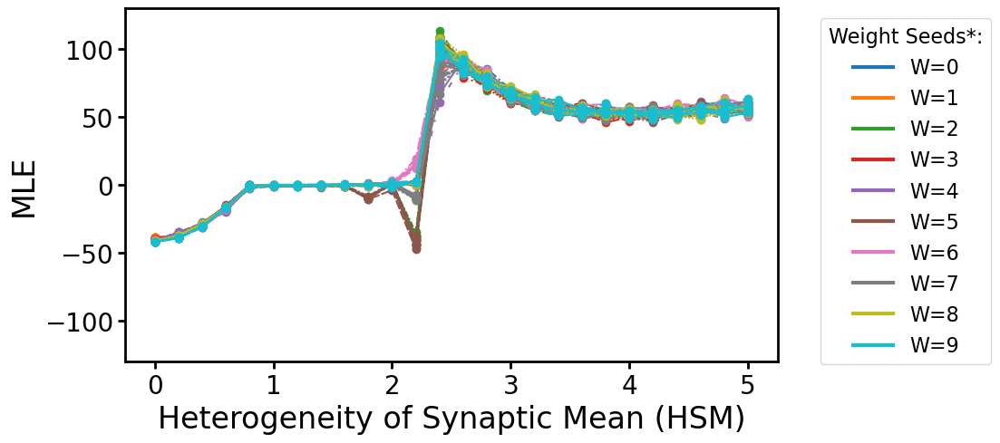

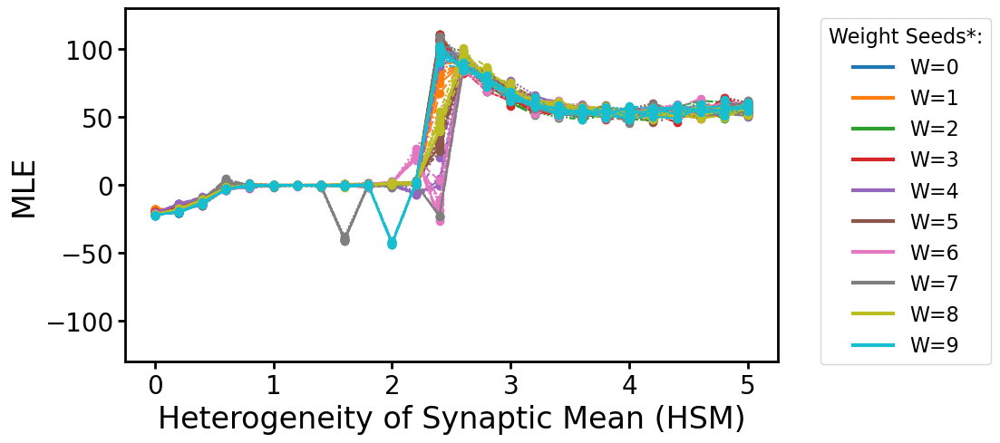

...

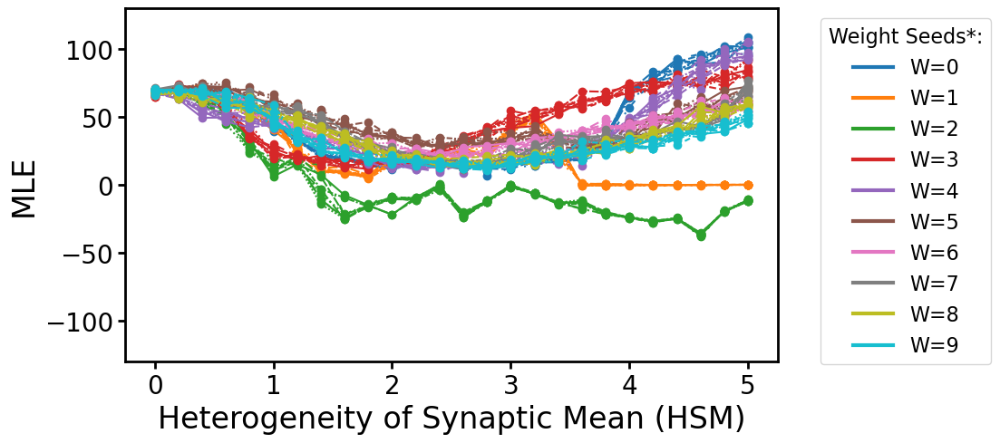

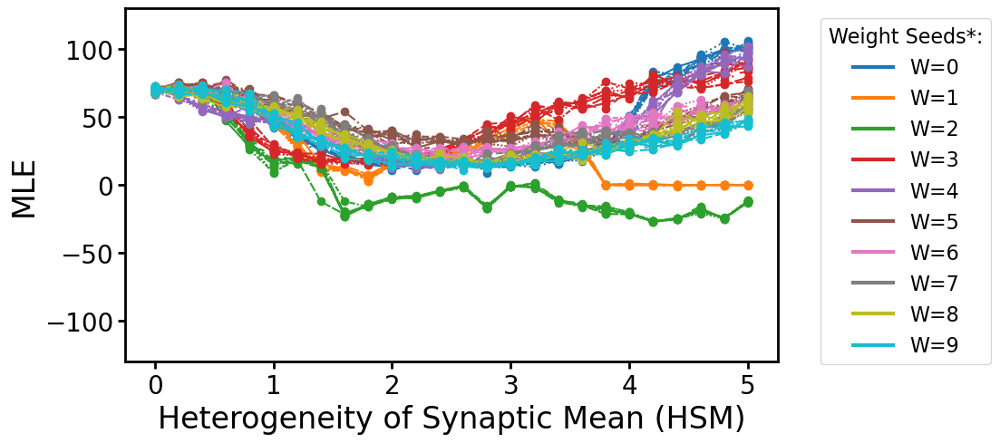

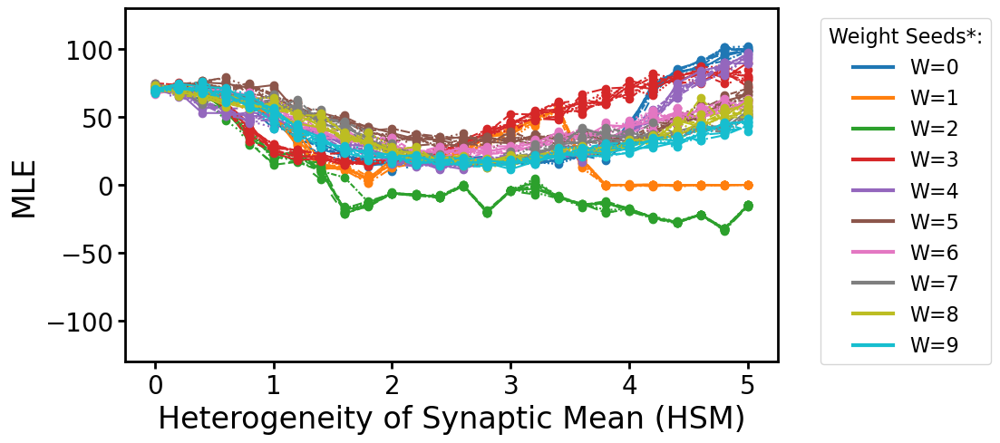

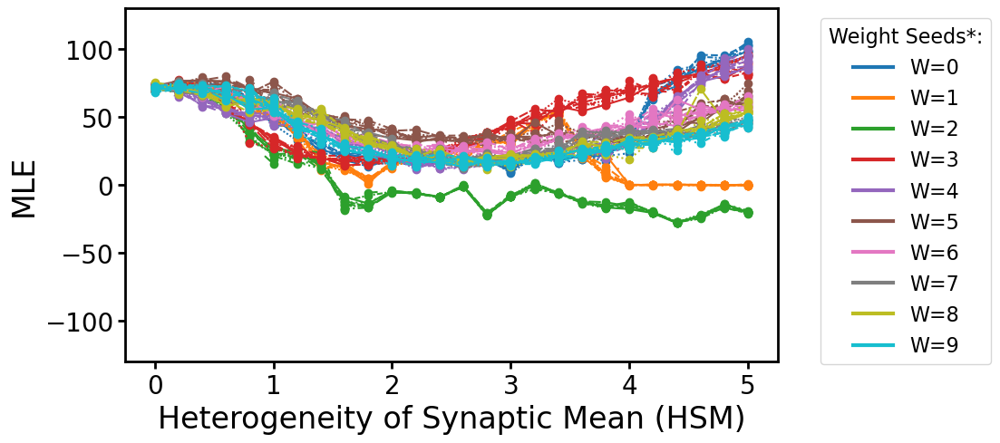

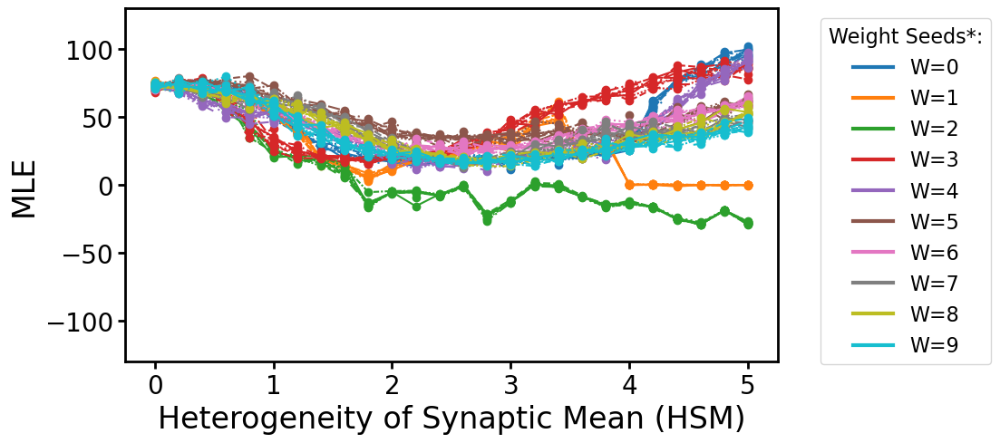

In [207]:
plt.rcParams['axes.titlesize'] = 20
plt.rcParams['axes.labelsize'] = 24    # x/y labels
plt.rcParams['xtick.labelsize'] = 20   # x ticks
plt.rcParams['ytick.labelsize'] = 20   # y ticks
plt.rcParams['legend.fontsize'] = 10   # legend text
plt.rcParams['figure.titlesize'] = 16  # suptitle (global title)
plt.rcParams['legend.title_fontsize'] = 16 # legend title

#tick size:
plt.rcParams['xtick.major.size'] = 6    # length of major ticks
plt.rcParams['ytick.major.size'] = 6
plt.rcParams['xtick.major.width'] = 2  # width of major ticks
plt.rcParams['ytick.major.width'] = 2

unique_Gains = np.unique(Gains_sorted)
print(unique_Gains)

unique_MSHs = np.unique(MSHs_sorted)

print(unique_MSHs)

# Colors for weight seeds


weights_seeds = np.unique(Weights_Seeds_sorted)
print(weights_seeds)

color_map = {ws: plt.cm.tab10(i % 10) for i, ws in enumerate(weights_seeds)}

# Linestyles for initialisation seeds
init_seeds_unique = np.unique(Initialisation_Seeds_sorted)
print(init_seeds_unique)

linestyle_tuple = [
    ('solid', 'solid'),
    ('dotted', 'dotted'),
    ('dashed', 'dashed'),
    ('dashdot', 'dashdot'),
    ('loosely dotted', (0, (1, 10))),
    ('densely dotted', (0, (1, 1))),
    ('loosely dashed', (0, (5, 10))),
    ('densely dashed', (0, (5, 1))),
    ('dashdotted', (0, (3, 5, 1, 5))),
    ('densely dashdotted', (0, (3, 1, 1, 1)))
]
linestyle_map = {is_: linestyle_tuple[i % len(linestyle_tuple)][1]
                 for i, is_ in enumerate(init_seeds_unique)} #not completely sure how this works, but I know what it gives qua result



# Loop over all combinations of seeds and gains
for i, gain in enumerate(unique_Gains):
    
    plt.figure(figsize=(12,5))
    for w_seed in weights_seeds:

        if w_seed in weights_seeds:
        
            for i_seed in init_seeds_unique:
                # Find indices matching this combination
                mask = (Weights_Seeds_sorted == w_seed) & (Initialisation_Seeds_sorted == i_seed) & (Gains_sorted == gain)
                if not np.any(mask):
                    continue
        
                # Extract LLEs for this pair
                lles = np.array(LLEs_sorted)[mask]
        
                # Sanity check: must align with unique_bounds length
                if len(lles) != len(unique_MSHs):
                    print(f"Skipping w={w_seed}, i={i_seed}, wrong length {len(lles)}")
                    continue
        
                # Plot
                
                plt.plot(unique_MSHs[:-1], lles[:-1],
                         color=color_map[w_seed],
                         linestyle=linestyle_map[i_seed],
                         marker='o')
                         #label=f"W={w_seed}, I={i_seed}") put this line back if you wanna see all the init seeds in the legend as well

    #Create legend handles only for weight seeds (colours)
    handles = [plt.Line2D([0], [0], color=color_map[w], lw=3, label=f"W={w}") for w in weights_seeds]

    
    
    plt.xlabel("Heterogeneity of Synaptic Mean (HSM)")
    plt.ylabel("MLE")
    plt.ylim(-130, 130)
    #plt.title(f"Maximal Lyapunov Exponent for 1000 N RNN and gain of {gain:.1f}")
    #plt.grid(True)
    plt.legend(handles=handles, title="Weight Seeds*:", bbox_to_anchor=(1.05, 1))
    plt.tight_layout()

     #for increasing the width of the plot edge line
    ax = plt.gca()
    for spine in ax.spines.values():
        spine.set_linewidth(2)
    
    #for increasing the width of the edge line of the colour bar
    cbar.outline.set_linewidth(2)
    
    filename = f"MLE Figure {i} for gain {gain:.1f}.png"
    #change path depending on 10% connectivity or not
    filepath = os.path.join(r"C:\Users\Lenovo\Documents\B. Master Neurophysics\Stage\Presentations and reports and code\code\LLE\MLE across MSH and W and I seeds for different gains", filename)
    plt.subplots_adjust(left = 0.2, right=0.8, top = 0.9, bottom = 0.12) #leaving space for legend
    plt.savefig(filepath, dpi = 300, bbox_inches='tight')
    #plt.savefig(filepath, dpi=300, bbox_inches='tight') #save each figure
    
    plt.show()


In [208]:
# video making



# Path where your saved figures are
folder = r"C:\Users\Lenovo\Documents\B. Master Neurophysics\Stage\Presentations and reports and code\code\LLE\MLE across MSH and W and I seeds for different gains"

# Collect all PNGs and sort them nicely
images = sorted(
    [img for img in os.listdir(folder) if img.endswith(".png")],
    key=lambda x: float(x.split("gain")[-1].replace(".png", "").strip())  # optional: sort by gain value
)

# Output video path
output_path = os.path.join(folder, "MLE_movie_1000N.mp4")

# Make the video (fps controls speed)
with imageio.get_writer(output_path,fps=3) as writer:
    for img_name in images:
        img_path = os.path.join(folder, img_name)
        writer.append_data(imageio.imread(img_path))

print("✅ Video saved at:", output_path)


IMAGEIO FFMPEG_WRITER WARNING: input image is not divisible by macro_block_size=16, resizing from (3306, 1464) to (3312, 1472) to ensure video compatibility with most codecs and players. To prevent resizing, make your input image divisible by the macro_block_size or set the macro_block_size to 1 (risking incompatibility).


✅ Video saved at: C:\Users\Lenovo\Documents\B. Master Neurophysics\Stage\Presentations and reports and code\code\LLE\MLE across MSH and W and I seeds for different gains\MLE_movie_1000N.mp4
